# Hits per Channel

This notebook analyses a SAMPIC data file and extracts the hits per channel

## Convert Data
Convert data from SAMPIC binary format to feather/parquet/root

In [76]:
from sampiclyser import SAMPIC_Run_Decoder
from natsort import natsorted
from pathlib import Path

In [79]:
base_path = Path("./data")
#DOING some tests for now, using just one Run003 file
#run_path = base_path/"Run029_SAMPIC_5_18_2025_12h_3min_Binary"
#run_path = base_path/"run028_SAMPIC_5_18_2025_11h_59min_Binary"
run_path = base_path/"Run018_SAMPIC_5_17_2025_23h_13min_Binary"
#run_path = base_path/"Run016_SAMPIC_5_17_2025_17h_27min_Binary"
#run_path = base_path/"sampic_20250906_192913_run13"
run_files = natsorted(list(run_path.glob("*.bin*")))
run_to_process = "Run018"
print(run_files)

[]


In [80]:
tmp = SAMPIC_Run_Decoder(run_path)
for file in tmp.run_files:
    with tmp.open_sampic_file_in_chunks_and_get_header(file, 1, debug=True) as (header, _):
        print(len(header))

In [72]:
tmp = SAMPIC_Run_Decoder(run_path)

for raw_hit in tmp.parse_hit_records(limit_hits=4):
    print(raw_hit)




{'HITNumber': 0, 'UnixTime': 1757179755.5349998, 'Channel': 10, 'Cell': 15, 'TimeStampA': 60596, 'TimeStampB': 60595, 'FPGATimeStamp': 19262691, 'StartOfADCRamp': 1399, 'RawTOTValue': -1, 'TOTValue': -1.0, 'PhysicalCell0Time': 192626440.0, 'OrderedCell0Time': 192626432.34375, 'Time': 192626436.92503065, 'Baseline': 0.2226048856973648, 'RawPeak': 0.23454022407531738, 'Amplitude': 0.011935338377952576, 'ADCCounterLatched': 1409, 'DataSize': 64, 'TriggerPosition': [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'DataSample': [0.22117337584495544, 0.2210722118616104, 0.22082042694091797, 0.2235511988401413, 0.22209368646144867, 0.22184836864471436, 0.22317348420619965, 0.2231842279434204, 0.22187727689743042, 0.2207440584897995, 0.2225843071937561, 0.22121664881706238, 0.22197550535202026, 0.22315067052841187, 0.22405670583248138, 0.2220751196146

In [6]:
#%%timeit -r 7 -n 5

## Final version
#hit_list = []
#for raw_hit in tmp.parse_hit_records(limit_hits=40):
#    hit_list.append(raw_hit)

In [6]:
#tmp.decode_data(feather_path=Path("./test.feather"), parquet_path=Path("./test.parquet"), root_path=Path("./test.root"))

In [16]:
tmp.decode_data(parquet_path=Path(f"./{run_to_process}.parquet"))

## Set which run to process in subsequent cells

In [81]:
from pathlib import Path
from PPS_TB_202505_RunDB import runs_to_configs, run_config_info
from PPS_TB_202505_RunDB import run_info as run_info_dict


parquet_file = Path(f"./{run_to_process}.parquet")
print(run_info_dict)

run_info = run_info_dict[run_to_process]
config_key = runs_to_configs[run_to_process]
config_info = run_config_info[config_key]
print(config_info)
print(run_info)

{'Run013_J': RunInformation(name='Run 013_J', trigger_mode='self', trigger_channels=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 23), data_format='binary', thresholds=None, comment='Config2_J. Rebuild configuration with 0.220V CFD baseline.'), 'Run001': RunInformation(name='Run 001', trigger_mode='self', trigger_channels=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9), data_format='binary', thresholds=None, comment='First run, very short, for testing binary unpacking'), 'Run002': RunInformation(name='Run 002', trigger_mode='self', trigger_channels=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9), data_format='binary', thresholds=None, comment='Short run with a little bit more statistics, still for unpacking'), 'Run003': RunInformation(name='Run 003', trigger_mode='self', trigger_channels=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9), data_format='binary', thresholds=None, comment='First long overnight run with output saved to multiple files'), 'Run004': RunInformation(name='Run 004', trigger_mode='self', trigger_

## Check Decoded Data

In [6]:
import pyarrow as pa
import pandas as pd
import pyarrow.parquet as pq
import pandas as pd

df = pd.read_parquet(parquet_file)
print(df.dtypes,"\n")
print(df.head(),"\n")
print(df.shape)  # (n_hits, n_columns)

HITNumber              int32
UnixTime             float64
Channel                int32
Cell                   int32
TimeStampA             int32
TimeStampB             int32
FPGATimeStamp         uint64
StartOfADCRamp         int32
RawTOTValue            int32
TOTValue               int32
PhysicalCell0Time    float64
OrderedCell0Time     float64
Time                 float64
Baseline             float32
RawPeak              float32
Amplitude            float32
ADCCounterLatched      int32
DataSize               int32
TriggerPosition       object
DataSample            object
dtype: object 

   HITNumber      UnixTime  Channel  Cell  TimeStampA  TimeStampB  \
0          0  1.757180e+09       10    15       60596       60595   
1          1  1.757180e+09        2     9       16502       16501   
2          2  1.757180e+09       11    50       26413       26413   
3          3  1.757180e+09        2     6       54910       54909   
4          4  1.757180e+09        2     8        1958      

In [10]:
#reader = pa.ipc.open_file("test.feather")
#reader.schema

In [11]:
#schema = pa.parquet.read_schema(Path('./test.parquet'), memory_map=True)
#schema

In [7]:
schema = pa.parquet.read_schema(parquet_file, memory_map=True)
schema

HITNumber: int32
UnixTime: double
Channel: int32
Cell: int32
TimeStampA: int32
TimeStampB: int32
FPGATimeStamp: uint64
StartOfADCRamp: int32
RawTOTValue: int32
TOTValue: int32
PhysicalCell0Time: double
OrderedCell0Time: double
Time: double
Baseline: float
RawPeak: float
Amplitude: float
ADCCounterLatched: int32
DataSize: int32
TriggerPosition: list<element: int32>
  child 0, element: int32
DataSample: list<element: float>
  child 0, element: float
-- schema metadata --
software_version: 'V3.3.24'
timestamp: '�M*	?
�A'
sampic_mezzanine_board_version: '2.61'
num_channels: '    '
ctrl_fpga_firmware_version: 'V2.1.7'
sampling_frequency: '6400 MS/s'
enabled_channels_mask: '�  '
reduced_data_type: ' '
without_waveform: ' '
tdc_like_files: ' '
hit_number_format: 'int'
unix_time_format: 'double'
data_format: 'Ch (int) CellInfo (int) TimeStampA (int) TimeStampB (int) (' + 323
trigger_position_format: 'array of int'
data_samples_format: 'array of float'
inl_correction: ''
adc_correction: ''
p

In [13]:
#df = pd.read_feather(Path("./test.feather"))
#df.tail()

In [14]:
# This is very slow for large files and in general not recommended to use, only using here as a quick test for small test files

#df = pd.read_parquet(parquet_file)
#df = pd.read_parquet(Path('./test.parquet'))
#df.tail()

## Generic Hits per channel

In [8]:
from sampiclyser.sampic_tools import get_channel_hits, plot_channel_hits

In [ ]:
hit_summary = get_channel_hits(parquet_file,)
hit_summary



,Channel,Hits
0,0,8760
1,1,92748
2,2,88359
3,3,22285
4,4,9112
5,5,63321
6,6,75691
7,7,30113
8,8,43847
9,9,99890


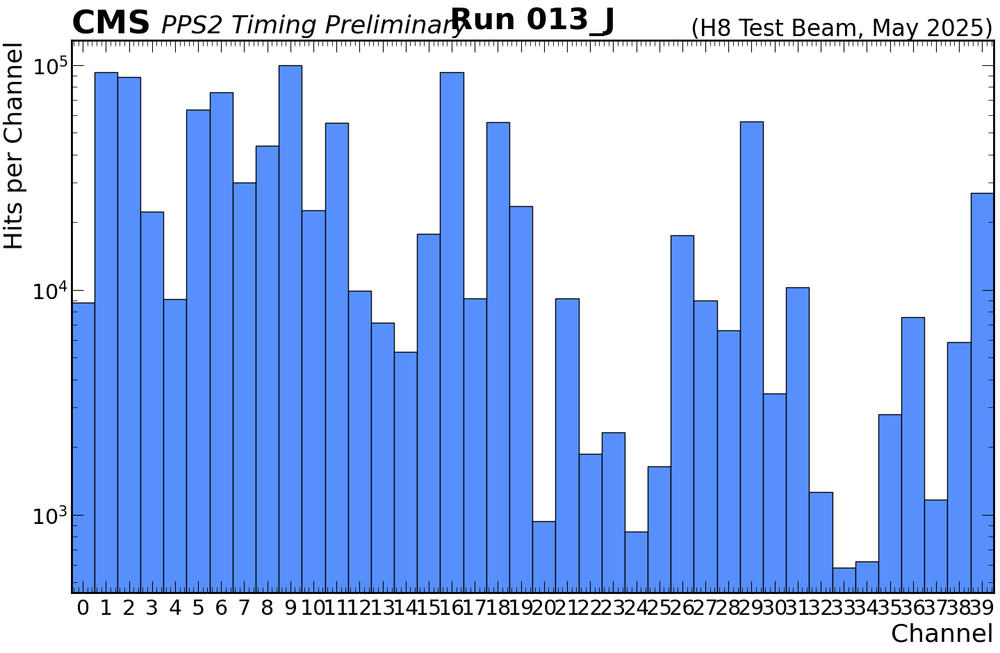

In [11]:
title = run_info.name
fig = plot_channel_hits(hit_summary, 0, 39, label="PPS2 Timing Preliminary", rlabel="(H8 Test Beam, May 2025)", log_y=True, figsize = (15, 10), title=title)
fig

## LGAD Mapping specific

In [12]:
from sampiclyser.sensor_hitmaps import plot_hitmap

In [19]:
# plot_title = run_info.name + " - Hitmaps"

# board_spec = [config_info.board_spec[board] for board in config_info.board_order]

# fig = plot_hitmap(
#     hit_summary,
#     specs=board_spec,
#     layout=(1, 2),
#     figsize=(11,6),
#     log_z = True,
#     title = plot_title,
#     do_sampic_ch = True,
#     do_board_ch= True,
#     coordinates="global",
# )

## Hit rate over time

In [12]:
from sampiclyser.sampic_tools import plot_hit_rate
import datetime

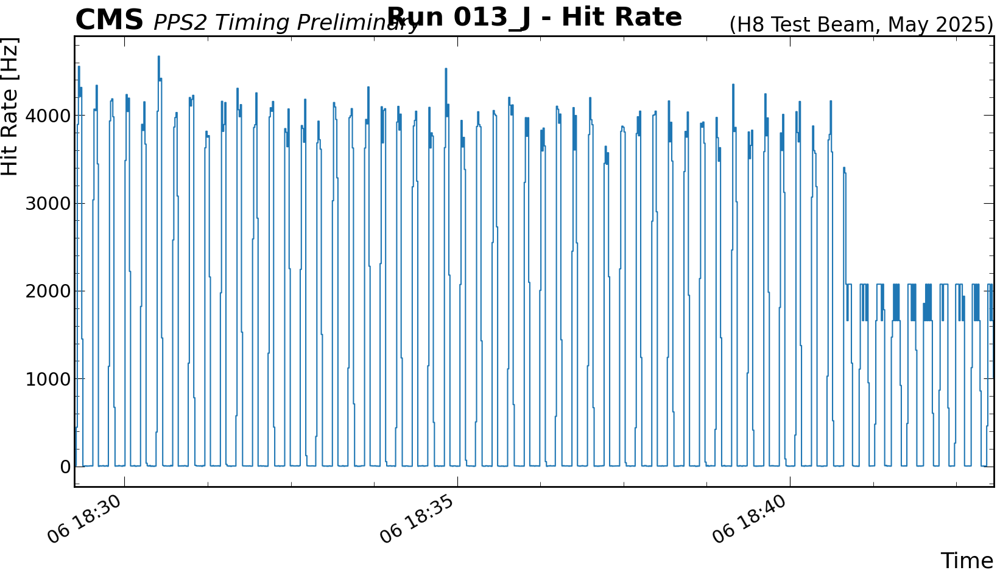

In [13]:
plot_title = run_info.name + " - Hit Rate"

fig = plot_hit_rate(
    parquet_file,
    plot_hits=False,
    bin_size=1,
    #start_time=datetime.datetime(2025, 5, 15, 23, 27),
    #end_time=datetime.datetime(2025, 5, 15, 23, 57),
    #start_time=datetime.datetime(2025, 5, 17, 1, 10),
    #end_time=datetime.datetime(2025, 5, 17, 1, 30),
    label="PPS2 Timing Preliminary",
    rlabel="(H8 Test Beam, May 2025)",
    #log_y=True,
    figsize = (17, 10),
    title=plot_title,
    )
fig

# Test Area

In [ ]:
#vv-------------José-------------vv# 
import importlib
import filter_functions
importlib.reload(filter_functions)
import pyarrow.parquet as pq
import pyarrow.compute as pc
import numpy as np
from filter_functions import compute_and_save_cfd50

print(run_to_process, "\n")

# Once per run — takes the same time as before but only paid once
compute_and_save_cfd50(
    parquet_file,
    output_path = f"{run_to_process}_cfd50.parquet",
    min_amplitude = 0.00,      # V — reject noise spikes
    edge_buffer_samples = 10,     # samples — peak must not be too close to buffer edge
    
)

Run013_J 



Computing CFD50: 11it [01:44,  9.46s/it]


CFD50 failures: 66,028 / 1,000,001 (6.60%)

Per‑channel CFD50 statistics:
  Channel 0: 8760 hits | CFD50 fails = 40 (0.46%)
  Channel 1: 92748 hits | CFD50 fails = 102 (0.11%)
  Channel 2: 88359 hits | CFD50 fails = 3664 (4.15%)
  Channel 3: 22285 hits | CFD50 fails = 1816 (8.15%)
  Channel 4: 9112 hits | CFD50 fails = 2534 (27.81%)
  Channel 5: 63321 hits | CFD50 fails = 503 (0.79%)
  Channel 6: 75691 hits | CFD50 fails = 2158 (2.85%)
  Channel 7: 30113 hits | CFD50 fails = 2090 (6.94%)
  Channel 8: 43847 hits | CFD50 fails = 2369 (5.40%)
  Channel 9: 99890 hits | CFD50 fails = 1952 (1.95%)
  Channel 10: 22592 hits | CFD50 fails = 6968 (30.84%)
  Channel 11: 55518 hits | CFD50 fails = 2076 (3.74%)
  Channel 12: 9895 hits | CFD50 fails = 2902 (29.33%)
  Channel 13: 7133 hits | CFD50 fails = 4601 (64.50%)
  Channel 14: 5321 hits | CFD50 fails = 2394 (44.99%)
  Channel 15: 17777 hits | CFD50 fails = 6915 (38.90%)
  Channel 16: 92843 hits | CFD50 fails = 185 (0.20%)
  Channel 17: 9147 hit

array([4.5969915 ,        nan, 4.46609764, ..., 4.99537791, 5.13496584,
       4.88022429], shape=(1000001,))

Run013_J 

First 20 times: [192626432.34375, 202671251.40625, 295831487.8125, 442917090.9375, 447630451.25, 452914713.125, 494620560.46875, 797395582.96875, 864194411.25, 898907737.8125, 986122493.28125, 1009409220.46875, 1205686478.59375, 1341793104.0625, 1742903567.5, 1920460761.25, 2159265729.21875, 2454314415.0, 2454314427.8125, 2454314386.71875]
First 20 channels: [10, 2, 11, 2, 2, 2, 11, 29, 2, 10, 34, 16, 11, 16, 28, 2, 26, 10, 27, 11]
Median inter-hit spacing (pivot ch): 2558813.4375
Min/Max timestamp: 192626432.34375 826324475882.0312 

Total hits  : 818,113
Pivot hits  : 88,359
Candidates  : 167,989 (20.5%)
CFD50 lookup failures: 31,846 / 167,989 (18.96%)
CFD50 lookup: 136,143 hits used, 31,846 dropped (not in lookup)


Building histograms (pivot ch 2): 100%|██████████| 84693/84693 [00:01<00:00, 42357.74it/s]



Coincidence summary:

  Ch 2 → Ch 0: 637 counts
  Ch 2 → Ch 1: 7026 counts
  Ch 2 → Ch 3: 2745 counts
  Ch 2 → Ch 4: 1584 counts
  Ch 2 → Ch 5: 5758 counts
  Ch 2 → Ch 6: 5626 counts
  Ch 2 → Ch 7: 3315 counts
  Ch 2 → Ch 8: 3023 counts
  Ch 2 → Ch 9: 3717 counts
  Ch 2 → Ch 10: 1547 counts
  Ch 2 → Ch 11: 2266 counts
  Ch 2 → Ch 12: 2282 counts
  Ch 2 → Ch 13: 1397 counts
  Ch 2 → Ch 14: 2231 counts
  Ch 2 → Ch 16: 1257 counts
  Ch 2 → Ch 17: 800 counts
  Ch 2 → Ch 18: 741 counts
  Ch 2 → Ch 19: 286 counts
  Ch 2 → Ch 23: 131 counts
  Multi-fit failed for channel: Optimal parameters not found: The maximum number of function evaluations is exceeded.


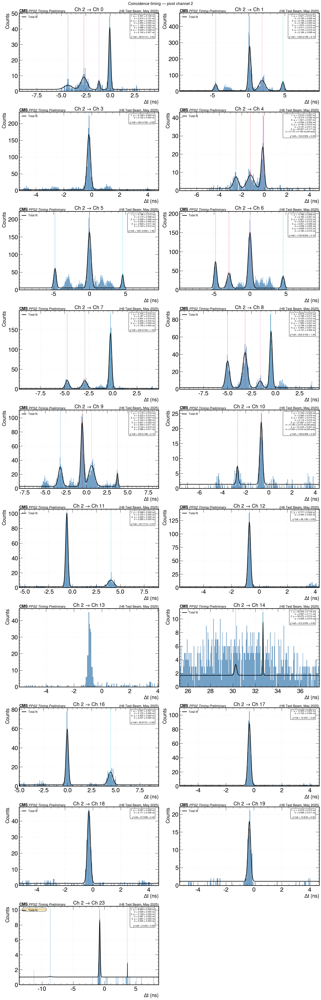

In [29]:
#Unfiltered coincidence histograms
import coincidence_histograms
importlib.reload(coincidence_histograms)
from coincidence_histograms import build_coincidence_histograms, plot_coincidence_histograms, plot_coincidence_histograms_multipeak

print(run_to_process, "\n")
table = pq.read_table(parquet_file, columns=["Channel", "OrderedCell0Time"])
times = table.column("OrderedCell0Time").to_pylist()
channels = table.column("Channel").to_pylist()
print("First 20 times:", times[:20])
print("First 20 channels:", channels[:20])

pivot_times = [t for t, c in zip(times, channels) if c == 1]
diffs = np.diff(pivot_times[:100])
print("Median inter-hit spacing (pivot ch):", np.median(diffs))
print("Min/Max timestamp:", min(times), max(times), "\n")

other_times = [t for t, c in zip(times, channels) if c != 1]



PIVOT_CHANNEL = 2


# Optional sanity check
#help(build_coincidence_histograms)


histograms = build_coincidence_histograms(
    parquet_path  = parquet_file,
    channel_filter= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19], 
    pivot_channel = PIVOT_CHANNEL,
    x_range       = 1_000, #1us
    bin_width     = 0.05,
    use_cfd50 = True,
    cfd50_path = f"{run_to_process}_cfd50.parquet",
)

print("\nCoincidence summary:\n")
for ch, result in histograms.items():
    print(f"  Ch {PIVOT_CHANNEL} → Ch {ch}: {result.total_counts} counts")


# plot_coincidence_histograms(
#     histograms,
#     pivot_channel = PIVOT_CHANNEL,
#     time_unit     = "ns",
#     fit_window    = 300,
#     plot_range    = 50,    # ±x ns around each fitted peak
#     logy          = False,
# )


plot_coincidence_histograms_multipeak(
    histograms,
    pivot_channel     = PIVOT_CHANNEL,
    time_unit         = "ns",
    prominence_frac   = 0.1,
    min_height_frac   = 0.01,
    min_distance_ns   = 0.5,
    smooth_sigma_bins = 0.0,
    fit_window        = 10.0,          # ~10x expected sigma of 0.3 ns
    sigma_max         = 2.0,          # no Gaussian wider than 2 ns
    merge_distance_ns = 0.6,          # merge peaks/fits closer than 0.5 ns
    plot_range        = 5.0,
    max_peaks         = 4,
)
# Access raw arrays for your own CMS-style plots:
#counts, edges = hists[4]  # channel 4 vs channel 1

In [ ]:
import numpy
from sampiclyser.sampic_tools import get_file_metadata
from sampiclyser.sampic_tools import get_period_from_file_metadata

parquet_file = Path(f"./{run_to_process}.parquet")

metadata = get_file_metadata(parquet_file)
print(metadata)

df = pd.read_parquet(parquet_file)

Data = df.sort_values("Channel")

Channels = numpy.unique(Data['Channel'])
print('Channels:')
print(Channels)
print()

size = Data['DataSize'].iloc[0]
print('Data Size:')
print(size)
print()

period = get_period_from_file_metadata(metadata)

tsteps = list(range(0,size))
for i in range(len(tsteps)):
    tsteps[i] = tsteps[i]*period

#tsteps


{'without_waveform': False, 'software_version': 'V3.3.24', 'inl_correction': True, 'timestamp': datetime.datetime(2025, 5, 17, 22, 14, 12, 661000), 'sampic_mezzanine_board_version': '2.61', 'hit_number_format': 'int', 'enabled_channels_mask': 1023, 'num_channels': 32, 'ctrl_fpga_firmware_version': 'V2.1.7', 'sampling_frequency': '6400 MS/s', 'reduced_data_type': False, 'tdc_like_files': False, 'unix_time_format': 'double', 'data_format': 'Ch (int) CellInfo (int) TimeStampA (int) TimeStampB (int) (FPGATimeStamp (u_int64) StartOfADCRamp (int) RawTOTValue (int in ADC Count) TOTValue (float in ns) PhysicalCell0Time (double in ns) OrderedCell0Time (double in ns) Time (double in ns) Baseline (in ADC or Volts) RawPeak (in ADC or Volts) Amplitude ((RawPeak - Baseline) in ADC ot Volts) ADCCounterLatched (int) DataSize(int)', 'trigger_position_format': 'array of int', 'data_samples_format': 'array of float', 'adc_correction': True}
Channels:
[0 1 2 3 4 5 6 7 8 9]

Data Size:
64



In [29]:
#from pathlib import Path
from typing import List, Tuple, Optional
#import numpy as np
from pyarrow import RecordBatch
#import awkward as ak
from sampiclyser.sampic_tools import open_hit_reader

def sampic_reconstruct_time_dict(rec: dict) -> float:
    """
    Function implementing the custom SAMPIC time reconstruction logic, operating on a dict of SAMPIC recorded fields

    Parameters
    ----------
    rec : dict
        Dictionary containing the required SAMPIC fields for time reconstruction
        Required:
            UnixTime -

    Raises
    ------
    ValueError
        If `use_unix_time` is False and no reconstruction algorithm
        is provided in `_reconstruct_time`.
    """
    # Placeholder for custom SAMPIC time reconstruction logic
    # Must return a float timestamp for a hit record `rec`
    return -rec['UnixTime']
    raise ValueError("Custom time reconstruction not implemented")

def check_time_ordering(
    file_path: Path,
    use_unix_time: bool = False,
    find_all: bool = False,
    batch_size: int = 100_000,
    root_tree: str = "sampic_hits"
) -> List[Tuple[int, float, float]]:
    """
    Verify that hit records in a SAMPIC output file are non-decreasing in time.

    Streams through the file in memory-efficient batches, reconstructs or
    reads each hit's timestamp, and checks for any out-of-order intervals.

    Parameters
    ----------
    file_path : pathlib.Path
        Path to the input data file (.parquet, .feather, or .root).
    use_unix_time : bool, optional
        If True, use the 'UnixTime' column directly as the hit timestamp.
        Otherwise, applies a custom reconstruction algorithm (must be
        implemented in `_reconstruct_time`).  Default is False.
    find_all : bool, optional
        If True, continue scanning the entire file and collect all
        out-of-order events; if False, stop at the first detection.
        Default is False.
    batch_size : int, optional
        Number of rows to read per batch from `open_hit_reader`.  Default is 100000.
    root_tree : str, optional
        Name of the TTree inside a ROOT file (only used for .root).  Default is "sampic_hits".

    Returns
    -------
    list of (hit_index, previous_time, current_time)
        A list of tuples for each detected out-of-order event, where:
        - `hit_index` is the zero-based index of the later (out-of-order) hit.
        - `previous_time` is the timestamp of the immediately preceding hit.
        - `current_time` is the timestamp of the out-of-order hit.
        If no violations are found, an empty list is returned.

    Raises
    ------
    ValueError
        If `use_unix_time` is False and no reconstruction algorithm
        is provided in `_reconstruct_time`.
    """

    violations: List[Tuple[int, float, float]] = []
    last_time: Optional[float] = None
    hit_idx = 0

    # Choose extractor function
    if use_unix_time:
        def extract_ts(batch, i):
            # batch may be RecordBatch or ak.Array
            if isinstance(batch, RecordBatch):
                return float(batch.column('UnixTime')[i].as_py())
            else:
                return float(numpy.asarray(batch['UnixTime'])[i])
    else:
        def extract_ts(batch, i):
            # call the placeholder reconstruction
            rec = {}
            # assemble record fields as needed for reconstruction
            for col in batch.schema.names if isinstance(batch, RecordBatch) else batch.fields:
                rec[col] = (batch.column(col)[i].as_py() if isinstance(batch, RecordBatch) else numpy.asarray(batch[col])[i])
            return sampic_reconstruct_time_dict(rec)

    # Stream through hits
    for batch in open_hit_reader(file_path, cols=[ 'UnixTime' ], batch_size=batch_size, root_tree=root_tree):
        # determine number of entries in this batch
        n = batch.num_rows if isinstance(batch, RecordBatch) else len(batch['UnixTime'])
        for i in range(n):
            ts = extract_ts(batch, i)
            if last_time is not None and ts < last_time:
                violations.append((hit_idx, last_time, ts))
                if not find_all:
                    return violations
            last_time = ts
            hit_idx += 1

    return violations

run_to_process = "test"
parquet_file = Path(f"./{run_to_process}.parquet")
feather_file = Path(f"./{run_to_process}.feather")
root_file = Path(f"./{run_to_process}.root")

print("Processing Parquet:")
print(check_time_ordering(parquet_file))#, use_unix_time = True))
print("Processing Feather:")
print(check_time_ordering(feather_file))#, use_unix_time = True))
print("Processing ROOT:")
print(check_time_ordering(root_file))#, use_unix_time = True))


#for run in ["Run001", "Run002", "Run003", "Run005", "Run006", "Run008", "Run016"]:
#    run_parquet_file = Path(f"./{run}.parquet")
#    print(f"Processing {run}:")
#    print(check_time_ordering(run_parquet_file, use_unix_time = True))


Processing Parquet:


FileNotFoundError: [WinError 2] Failed to open local file 'test.parquet'. Detail: [Windows error 2] The system cannot find the file specified.


In [30]:
def extract_unix_time_and_record(batch, idx):
    rec = {}
    for col in batch.schema.names if isinstance(batch, RecordBatch) else batch.fields:
        rec[col] = batch.column(col)[idx].as_py() if isinstance(batch, RecordBatch) else np.asarray(batch[col])[idx]

    if isinstance(batch, RecordBatch):
        ts = float(batch.column('UnixTime')[idx].as_py())
    else:
        ts = float(np.asarray(batch['UnixTime'])[idx])

    return ts, rec


def extract_SAMPIC_time_and_record(batch, idx):
    rec = {}
    for col in batch.schema.names if isinstance(batch, RecordBatch) else batch.fields:
        rec[col] = batch.column(col)[idx].as_py() if isinstance(batch, RecordBatch) else np.asarray(batch[col])[idx]

    ts = sampic_reconstruct_time_dict(rec)

    return ts, rec

In [31]:
from pathlib import Path
from typing import Optional, List, Tuple, Dict
import numpy as np
import pyarrow as pa
import pyarrow.parquet as pq
import pyarrow.feather as feather
from pyarrow import RecordBatch, Table
import awkward as ak
import uproot
from sampiclyser.sampic_tools import open_hit_reader
from sampiclyser.sampic_tools import get_file_metadata
#from sampiclyser.sampic_tools import sampic_reconstruct_time_dict
#from sampiclyser.sampic_decoder import build_empty_root_data_with_schema
from sampiclyser.sampic_decoder import build_schema
#from sampiclyser.sampic_decoder import SAMPIC_Schema_Info
from pyarrow.ipc import new_file
import struct
from contextlib import contextmanager
import heapq

from dataclasses import dataclass, field
from typing import Any

SAMPIC_Schema_Info = {
    # Format:
    # Name: (pandas, pyarrow, numpy for root)
    "HITNumber": ("int32", pa.int32(), np.int32),
    "UnixTime": ("float64", pa.float64(), np.double),
    "Channel": ("int32", pa.int32(), np.int32),
    "Cell": ("int32", pa.int32(), np.int32),
    "TimeStampA": ("int32", pa.int32(), np.int32),
    "TimeStampB": ("int32", pa.int32(), np.int32),
    "FPGATimeStamp": ("uint64", pa.uint64(), np.double),
    "StartOfADCRamp": ("int32", pa.int32(), np.int32),
    "RawTOTValue": ("int32", pa.int32(), np.int32),
    "TOTValue": ("int32", pa.int32(), np.int32),
    "PhysicalCell0Time": ("float64", pa.float64(), np.double),
    "OrderedCell0Time": ("float64", pa.float64(), np.double),
    "Time": ("float64", pa.float64(), np.double),
    "Baseline": ("float32", pa.float32(), np.float32),
    "RawPeak": ("float32", pa.float32(), np.float32),
    "Amplitude": ("float32", pa.float32(), np.float32),
    "ADCCounterLatched": ("int32", pa.int32(), np.int32),
    "DataSize": ("int32", pa.int32(), np.int32),
    "TriggerPosition": (None, pa.list_(pa.int32()), np.int32, 64),
    "DataSample": (None, pa.list_(pa.float32()), np.float32, 64),
    # … etc …
}

def build_empty_root_data_with_schema(schemaInfo: Dict[str, Tuple] = SAMPIC_Schema_Info):
    ret_val = {}
    for column in schemaInfo:
        if schemaInfo[column][2] is not None:
            if len(schemaInfo[column]) == 4:
                ret_val[column] = np.empty((0, schemaInfo[column][3]), dtype=schemaInfo[column][2])
            else:
                ret_val[column] = np.empty(0, dtype=schemaInfo[column][2])

    return ret_val


def prepare_header_metadata_in_bytes(metadata: Dict[str, object]) -> Dict[bytes, bytes]:
    retVal: Dict[bytes, bytes] = {}
    for key in metadata:
        new_key = key.encode('ascii')

        # If string variable
        if key in ['software_version', 'sampic_mezzanine_board_version', 'ctrl_fpga_firmware_version', 'sampling_frequency', 'hit_number_format', 'unix_time_format', 'data_format', 'trigger_position_format', 'data_samples_format']:
            new_val = metadata[key].encode('ascii')
        # If timestamp variable
        elif key in ['timestamp', ]:
            print(type(metadata[key]))
            new_val = struct.pack('<d', metadata[key].timestamp())
        # If integer variable
        elif key in ['num_channels', 'enabled_channels_mask']:
            new_val = struct.pack('<I', metadata[key])
        # If boolean variable
        elif key in ['reduced_data_type', 'without_waveform', 'tdc_like_files', 'inl_correction', 'adc_correction']:
            new_val = b'\x01' if metadata[key] else b'\x00'
        else:
            print(f"Unknown metadata field: {key}")
            continue

        retVal[new_key] = new_val
    return retVal


@contextmanager
def reprocess_data_files(
    input_path: Path,
    output_feather_path: Optional[Path] = None,
    output_parquet_path: Optional[Path] = None,
    output_root_path: Optional[Path] = None,
    root_tree: str = "sampic_hits",
    schemaInfo: Dict[str, Tuple] = SAMPIC_Schema_Info,
    new_columns: Optional[List[str]] = None,
    restrict_columns: Optional[List[str]] = None,
):
    feather_writer = None
    parquet_writer = None
    root_tree_obj = None

    input_suffix = input_path.suffix.lower()

    metadata = get_file_metadata(input_path)
    metadata_bytes = prepare_header_metadata_in_bytes(metadata)

    rebuild_schema = False
    if input_suffix in ('.parquet', '.pq'):
        pqf = pq.ParquetFile(str(input_path))
        columns = pqf.schema_arrow.names

        if new_columns is not None or restrict_columns is not None:
            rebuild_schema = True
        else:
            schema = pqf.schema_arrow
    elif input_suffix == '.feather':
        rf = feather.read_table(str(input_path), memory_map=True)
        columns = list(rf.schema.names)

        if new_columns is not None or restrict_columns is not None:
            rebuild_schema = True
        else:
            schema = rf.schema
    elif input_suffix == '.root':
        reader = uproot.open(str(input_path))
        tree = reader[root_tree]
        columns = list(tree.keys())
        reader.close()
        rebuild_schema = True
    else:
        raise ValueError(f"Unsupported input format: {input_suffix}")

    if rebuild_schema:
        if restrict_columns is not None:
            columns = list(set(columns) & set(restrict_columns))
        if new_columns is not None:
            columns = columns + new_columns

        schema = build_schema(metadata=metadata_bytes, schemaInfo=schemaInfo)

    try:
        if output_parquet_path:
            #parquet_writer = pq.ParquetWriter(str(output_path), schema,
            #                           version='2.0', use_deprecated_int96_timestamps=False,
            #                           metadata=metadata)
            parquet_writer = pq.ParquetWriter(str(output_parquet_path), schema)
        if output_feather_path:
            sink = open(output_feather_path, "wb")
            feather_writer = new_file(sink, schema)
        if output_root_path:
            froot = uproot.recreate(output_root_path)
            froot[root_tree] = build_empty_root_data_with_schema(schemaInfo=schemaInfo)
            root_tree_obj = froot[root_tree]

        yield (columns, schema, feather_writer, parquet_writer, root_tree_obj)

    finally:
        if output_root_path:
            # Convert to Awkward Arrays of strings for variable-length support
            keys = ak.from_iter(list(metadata.keys()), highlevel=True)
            vals = ak.from_iter([str(v) for v in metadata.values()], highlevel=True)

            # Assign the new metadata TTree
            froot['metadata'] = {
                'key': keys,
                'value': vals,
            }

        # Close writers
        if parquet_writer:
            parquet_writer.close()
        if feather_writer:
            feather_writer.close()
            sink.close()
        # ROOT file closed by context of recreate()


@dataclass(order=True)
class TimestampedRecord:
    timestamp: float
    record: Any=field(compare=False)


def reorder_hits(
    input_path: Path,
    output_feather_path: Optional[Path] = None,
    output_parquet_path: Optional[Path] = None,
    output_root_path: Optional[Path] = None,
    root_tree: str = "sampic_hits",
    use_unix_time: bool = False,
    batch_size: int = 100_000,
    max_time_offset: Optional[float] = None,
    schemaInfo: Dict[str, Tuple] = SAMPIC_Schema_Info,
) -> None:
    """
    Stream and reorder hit records into non-decreasing time order, writing to a new file.

    This function reads hit records from `input_path` (Feather, Parquet, or ROOT) in
    memory-efficient batches, reconstructs or reads each hit's timestamp, and emits
    them in sorted order (non-decreasing time) to `output_path` in the same or different
    format.  A sliding window (heap) is used to handle small out-of-order intervals
    up to `max_time_offset` if provided, otherwise fully buffers.

    Parameters
    ----------
    input_path : pathlib.Path
        Path to the input data file (.parquet, .pq, .feather, or .root).
    output_feather_path : pathlib.Path or None, optional
        If not None, path to write the DataFrame in Feather format.
    output_parquet_path : pathlib.Path or None, optional
        If not None, path to write the DataFrame in Parquet format.
    output_root_path : pathlib.Path or None, optional
        If not None, path to write the DataFrame to a ROOT file.
    root_tree : str, optional
        Name of the TTree inside the ROOT file (default: `"sampic_hits"`).
    use_unix_time : bool, default False
        If True, use the 'UnixTime' column directly; otherwise use
        `sampic_reconstruct_time_dict` to compute timestamps.
    batch_size : int, default 100000
        Number of rows per batch in streaming I/O.
    max_time_offset : float or None, optional
        Maximum expected out-of-order time (seconds).  If set, the function
        emits records whose timestamp is older than current minimum minus this
        offset.  If None, the function buffers all data until end before writing.

    Returns
    -------
    None

    Raises
    ------
    ValueError
        If timestamp reconstruction fails or required columns missing.

    Notes
    -----
    - Metadata from `input_path` is propagated to `output_path` via
      `get_file_metadata` and appropriate writer metadata APIs.
    - For ROOT output, metadata is written in a 'metadata' TTree.
    """
    with reprocess_data_files(
        input_path=input_path,
        output_feather_path=output_feather_path,
        output_parquet_path=output_parquet_path,
        output_root_path=output_root_path,
        root_tree=root_tree,
        schemaInfo=schemaInfo
    ) as (columns, schema, feather_writer, parquet_writer, root_tree_obj):
        heap: List[TimestampedRecord] = []  # min-heap of (timestamp, record dict)
        current_max_time = None

        if use_unix_time:
            extract_time_and_record = extract_unix_time_and_record
        else:
            extract_time_and_record = extract_SAMPIC_time_and_record

        # Stream input into heap
        for batch in open_hit_reader(input_path, cols=columns, batch_size=batch_size, root_tree=root_tree):
            n = batch.num_rows if isinstance(batch, RecordBatch) else len(batch[columns[0]])

            for i in range(n):
                ts, rec = extract_time_and_record(batch, i)
                if current_max_time is None or ts > current_max_time:
                    current_max_time = ts
                heapq.heappush(heap, TimestampedRecord(ts, rec))


                # Emit from heap if out-of-order window exceeded
                if max_time_offset is not None:
                    cutoff = current_max_time - max_time_offset
                    while heap and heap[0].timestamp <= cutoff:
                        out_rec = heapq.heappop(heap).record

                        # write out_rec to enabled writers
                        if feather_writer or parquet_writer:
                            #tbl = Table.from_pydict(out_rec)
                            tbl = Table.from_pydict({k: [v] for k, v in out_rec.items()}, schema=schema)
                            if feather_writer:
                                feather_writer.write(tbl)
                            if parquet_writer:
                                parquet_writer.write_table(tbl)
                        if root_tree_obj:
                            root_data = {}
                            for column in schemaInfo:
                                if schemaInfo[column][2] is not None and column in out_rec:
                                    root_data[column] = np.array([out_rec[column]], dtype=schemaInfo[column][2])

                            root_tree_obj.extend(root_data)
        while heap:
            out_rec = heapq.heappop(heap).record

            # write out_rec to enabled writers
            if feather_writer or parquet_writer:
                #tbl = Table.from_pydict(out_rec)
                tbl = Table.from_pydict({k: [v] for k, v in out_rec.items()}, schema=schema)
                if feather_writer:
                    feather_writer.write(tbl)
                if parquet_writer:
                    parquet_writer.write_table(tbl)
            if root_tree_obj:
                root_data = {}
                for column in schemaInfo:
                    if schemaInfo[column][2] is not None and column in out_rec:
                        root_data[column] = np.array([out_rec[column]], dtype=schemaInfo[column][2])

                root_tree_obj.extend(root_data)

run_to_process = "test"
parquet_file = Path(f"./{run_to_process}.parquet")
feather_file = Path(f"./{run_to_process}.feather")
root_file = Path(f"./{run_to_process}.root")

print("Processing Parquet:")
print(reorder_hits(
                   parquet_file,
                   output_parquet_path=Path("reorder_test_pq_to.pq"),
                   output_feather_path=Path("reorder_test_pq_to.feather"),
                   output_root_path=Path("reorder_test_pq_to.root"),
                   max_time_offset=60,
                   ))
                   #use_unix_time = True))
print("Processing Feather:")
print(reorder_hits(
                   feather_file,
                   output_feather_path=Path("reorder_test_ft_to.feather"),
                   output_parquet_path=Path("reorder_test_ft_to.pq"),
                   output_root_path=Path("reorder_test_ft_to.root"),
                   max_time_offset=60,
                   ))#, use_unix_time = True))
print("Processing ROOT:")
print(reorder_hits(
                   root_file,
                   output_root_path=Path("reorder_test_root_to.root"),
                   output_feather_path=Path("reorder_test_root_to.feather"),
                   output_parquet_path=Path("reorder_test_root_to.pq"),
                   max_time_offset=60,
                   ))#, use_unix_time = True))


Processing Parquet:


FileNotFoundError: [WinError 2] Failed to open local file 'test.parquet'. Detail: [Windows error 2] The system cannot find the file specified.


In [32]:
df = pd.read_parquet(Path("reorder_test_root_to.pq"))
df

FileNotFoundError: [Errno 2] No such file or directory: 'reorder_test_root_to.pq'

In [33]:
from pathlib import Path
from typing import Iterator, Sequence, Union
import pyarrow.parquet as pq
import pyarrow.dataset as ds
import uproot
from pyarrow import RecordBatch
import awkward as ak

from sampiclyser.sampic_tools import open_hit_reader

for batch in open_hit_reader(Path("test.root"), ["Channel", "Baseline"], batch_size=4):
    print(type(batch))
    print(batch)
    if isinstance(batch, RecordBatch):
        arr = batch["Channel"].to_numpy()
    else:
        arr = batch["Channel"]
    print(arr)
    break

FileNotFoundError: [Errno 2] No such file or directory: 'c:/Users/josev/OneDrive/coisas externas/LIP/PPS2-Timing-TB-Analysis/test.root'

In [34]:
from typing import Set

from sampiclyser.sampic_tools import select_waveforms

batches = open_hit_reader(Path("test.root"), ["HITNumber", "Channel", "Baseline", "DataSize", "DataSample", "TriggerPosition"])
for waveform in select_waveforms(batches, 0, 10, [0]):
    print(waveform)

FileNotFoundError: [Errno 2] No such file or directory: 'c:/Users/josev/OneDrive/coisas externas/LIP/PPS2-Timing-TB-Analysis/test.root'

In [35]:
import numpy as np
from typing import Tuple

from sampiclyser.sampic_tools import reorder_circular_samples_with_trigger


trig = np.array([0, 0, 0, 1, 1, 0])
samp = np.arange(6)
t_new, s_new, start_mask = reorder_circular_samples_with_trigger(trig, samp, True)
print(t_new)
print(s_new)
print(start_mask)

[0 0 0 0 1 1]
[5 0 1 2 3 4]
[0 1 0 0 0 0]


Plot hits

In [ ]:
from pathlib import Path
from PPS_TB_202505_RunDB import runs_to_configs, run_config_info
from PPS_TB_202505_RunDB import run_info as run_info_dict

parquet_file = Path(f"./{run_to_process}.parquet")

run_info = run_info_dict[run_to_process]
config_key = runs_to_configs[run_to_process]
config_info = run_config_info[config_key]
print(config_info)

ConfigInformation(name='Config 4', sampic_to_board={'PPS_LGAD_03': {0: 1, 1: 2, 2: 8, 6: 10, 7: 9}, 'PPS_TILGAD_AIDA_01': {3: 8, 4: 2, 5: 1, 8: 9, 9: 10}}, bias_voltage={'PPS_LGAD_03': -230.0, 'PPS_TILGAD_AIDA_01': -200.0}, power={'ch1': 4.1, 'ch2': 4.1}, power_connections={'ch1': ('CA01', 'CA02', 'CA03', 'LA01', 'LA02', 'LA04'), 'ch2': ('CA04', 'CA05', 'CA06', 'LA05')}, sampic_amplifiers={0: 'CA01', 1: 'CA02', 2: 'CA03', 3: 'CA04', 4: 'CA05', 5: 'CA06', 6: 'LA01', 7: 'LA02', 8: 'LA04', 9: 'LA05'}, board_order=['PPS_LGAD_03', 'PPS_TILGAD_AIDA_01'], sensor_channels={1: [(4, 0)], 2: [(4, 1), (4, 2), (3, 1), (3, 2)], 3: [(2, 0), (2, 1)], 4: [(1, 1)], 5: [(0, 0)], 6: [(0, 3), (1, 3), (2, 3)], 7: [(0, 4), (1, 4), (2, 4), (3, 4)], 8: [(2, 2)], 9: [(3, 3)], 10: [(4, 4)]})


In [66]:
#Define functions for lables
from pathlib import Path
from matplotlib.axes import Axes
from typing import Optional, List

#from sampiclyser.sampic_tools import ordinal, set_waveform_titles_and_labels

# Taken from: https://stackoverflow.com/a/20007730
def ordinal(n: int):
    if 11 <= (n % 100) <= 13:
        suffix = 'th'
    else:
        suffix = ['th', 'st', 'nd', 'rd', 'th'][min(n % 10, 4)]
    return str(n) + suffix

def set_waveform_titles_and_labels(
    ax: Axes,
    file_path: Path,
    file_name_id: Optional[str] = None,
    title: Optional[str] = None,
    channel_filter: Optional[List[int]] = None,
    first_hit: int = 0,
    hits_plotted: int = 1,
    time_scale: float = 1.0,
) -> None:
    """
    Set the main title and axis labels for a waveform plot.

    If `title` is provided, it is used verbatim. Otherwise an automatic
    title is constructed based on `file_name_id`, which run hit range,
    and optionally a channel filter.

    The x-axis label is set to “Time […]” with units chosen from
    the `time_scale` (s, ms, µs, ns, ps).  The y-axis is always labeled
    “Voltage [V]”.

    Parameters
    ----------
    ax : matplotlib.axes.Axes
        The Axes object on which to set titles and labels.
    file_path : pathlib.Path
        Path of the source data file; used to default `file_name_id`.
    file_name_id : str or None, optional
        Short identifier for the file (e.g. filename without path).
        If None or empty, defaults to `file_path.name`.
    title : str or None, optional
        If provided, this exact string is set as the plot title.  If None,
        an automatic title is generated.
    channel_filter : list of int or None, optional
        If plotting only a subset of channels, used to annotate the title:
        - Single-element list → “Channel N”
        - Multi-element list  → “Selected Channel”
    first_hit : int, default 0
        Index of the first hit plotted (0-based).  Used in automatic title
        when `title` is None.
    hits_plotted : int, default 1
        Number of hits actually drawn.  Used in automatic title when
        `title` is None.
    time_scale : float, default 1.0
        Factor applied to the “time” values before labeling and tick formatting.
        Must be one of [1, 1e3, 1e6, 1e9, 1e12], corresponding to
        seconds, milliseconds, microseconds, nanoseconds, and picoseconds.

    Returns
    -------
    None

    Raises
    ------
    RuntimeError
        If `time_scale` is not one of the recognized values.

    Examples
    --------
    >>> fig, ax = plt.subplots()
    >>> set_waveform_titles_and_labels(
    ...     ax,
    ...     Path("/data/run123"),
    ...     file_name_id="run123",
    ...     title=None,
    ...     channel_filter=[2],
    ...     first_hit=5,
    ...     hits_plotted=10,
    ...     time_scale=1e6
    ... )
    """
    auto = (title is None)

    if not file_name_id:
        file_name_id = file_path.name

    if auto:
        qualifier = ""
        if channel_filter is not None:
            if len(channel_filter) == 1:
                qualifier = f" Channel {channel_filter[0]}"
            else:
                qualifier = " Selected Channels"

        if first_hit == 0:
            prefix = f"First {hits_plotted}"
            suffix = ""
        else:
            prefix = f"{hits_plotted} sequential"
            suffix = f" after {ordinal(first_hit)} hit"

        ax.set_title(
            f"{prefix}{qualifier} Waveforms from {file_name_id}{suffix}",
            pad=12,
            weight="bold"
        )
    else:
        ax.set_title(title, pad=12, weight="bold")

    # Determine time units
    units_map = {
        1.0:    "s",
        1e3:   "ms",
        1e6:   "µs",
        1e9:   "ns",
        1e12:  "ps",
    }
    try:
        units = units_map[time_scale]
    except KeyError:
        raise RuntimeError(f"Unknown time scale: {time_scale}")

    ax.set_xlabel(f"Time [{units}]")
    ax.set_ylabel("Voltage [V]")


In [33]:
from typing import Any
from natsort import natsorted
from matplotlib.lines import Line2D
from typing import Optional
import matplotlib.pyplot as plt
import mplhep as hep
import itertools
from typing import Dict
from typing import Literal
from matplotlib.axes import Axes

from sampiclyser.sampic_tools import finalize_waveform_legend, plot_waveform, select_waveforms, get_period_from_file_metadata


def plot_channel_waveforms(
    file_path: Path,
    root_tree: str = "sampic_hits",
    batch_size: int = 100_000,
    first_hit: int = 0,
    num_hits: int = 10,
    channel_filter: Optional[list[int]] = None,
    interpolation_method: Optional[str] = "sinc",
    interpolation_factor: int = 4,
    interpolation_parameter: int = 8,
    cms_label: str = "PPS",
    log_y: bool = False,
    figsize: tuple[float, float] = (6, 4),
    rlabel: str = "(13 TeV)",
    is_data: bool = True,
    title: Optional[str] = None,
    file_name_id: Optional[str] = None,
    cmap: Optional[str] = None,
):
    """
    Plot sampled waveforms with sinc-interpolation and trigger markers.

    For up to `max_records` waveforms, reads “DataSize”, “TriggerPosition”,
    and “DataSample” from a Parquet/Sampic-decoder file in streaming batches,
    computes the sample times from metadata, draws:

      1. A sinc-interpolated continuous line through the samples
      2. Non-trigger hits as dots ('.')
      3. Trigger hits as X's ('x')

    Parameters
    ----------
    file_path : pathlib.Path
        Path to a `.parquet` or `.pq` file containing columns
        `DataSize`, `TriggerPosition`, and `DataSample`.
    batch_size : int, optional
        Number of rows to read per I/O batch (default: 100_000).
    max_records : int or None, optional
        Maximum number of waveforms to plot (per file).  If None, plots all.
        (default: 10)
    interpolation_factor : int, optional
        How many points to interpolate between each pair of original samples
        (default: 10), i.e. total points = `DataSize * interpolation_factor`.

    Raises
    ------
    ValueError
        If `file_path` is not Parquet or PQ.
    RuntimeError
        If required columns are missing.

    Notes
    -----
    - Uses `get_file_metadata` → `get_period_from_file_metadata` to compute
      the per-sample period.
    - Uses NumPy's `sinc` (i.e. sin(πx)/(πx)) for bandlimited interpolation.
    - Pulls colors from Matplotlib's cycle so the line and its markers
      share the same color with no hard-coding.
    """
    # 1) get period
    run_metadata = get_file_metadata(file_path)
    period = get_period_from_file_metadata(run_metadata)
    print(metadata)

    # 2) Open reader
    batches = open_hit_reader(file_path, ["HITNumber", "Channel", "Baseline", "DataSize", "DataSample", "TriggerPosition"], batch_size=batch_size, root_tree=root_tree)

    # 3) Filter & iterate
    waveforms = select_waveforms(batches, first_hit, num_hits, channel_filter)

    # 4) Setup figure
    #   Plot Style
    plt.style.use(hep.style.CMS)
    #   Create figure and axis with custom size and create the plot
    fig, ax = plt.subplots(figsize=figsize)
    #   Setup coloring options
    if cmap is None:
        colors_list = plt.rcParams['axes.prop_cycle'].by_key()['color']
    else:
        colors_list = plt.get_cmap(cmap).colors # "tab10" cmap works well
    color_cycle = itertools.cycle(colors_list)
    channel_colors = {}

    #   Setup interpolation options
    interp_kwargs = dict(
        interpolation_method=interpolation_method,
        interpolation_factor=interpolation_factor,
        interpolation_parameter=interpolation_parameter,
    )

    label_channel = True
    label_hit = False
    if channel_filter is not None and len(channel_filter) == 1:
        label_channel = False
        label_hit = True

    plot_sample_types = True
    reorder_circular_buffer = True
    reorder_samp_arr = False
    plot_buffer_start = True
    explicit_labels = False
    time_scale = 10**9

    if num_hits == 1:
        explicit_labels = True
        label_channel = True
        label_hit = True

    if label_channel and label_hit:
        label_mode = "both"
    elif label_channel:
        label_mode = "channel"
    elif label_hit:
        label_mode = "hit"
    else:
        label_mode = "none"

    # 5) Plot each
    hits_plotted = 0
    for hid, channel, baseline, n, trig, samp in waveforms:
        if not label_hit:
            color = channel_colors.setdefault(channel, next(color_cycle))
        else:
            color = next(color_cycle)
        plot_waveform(ax, hid, channel, baseline, samp, trig, period, color, interp_kwargs, label_mode, reorder_circular_buffer, reorder_samp_arr, plot_sample_types, plot_buffer_start, explicit_labels, time_scale)
        hits_plotted += 1


    # 6) Finalize
    hep.cms.label(cms_label, data=is_data, rlabel=rlabel, ax=ax)
    finalize_waveform_legend(ax, label_mode, plot_sample_types, plot_buffer_start, explicit_labels)
    set_waveform_titles_and_labels(ax, file_path, file_name_id=file_name_id, title=title, channel_filter=channel_filter, first_hit=first_hit, hits_plotted=hits_plotted, time_scale=time_scale)
    if log_y: ax.set_yscale('log')
    plt.tight_layout()
    plt.show()
    return

    # Y-axis scale and formatting
    if log_y:
        ax.set_yscale('log')

    #ax.legend(loc='upper right')

    # after all your plotting calls:
    #handles, labels = ax.get_legend_handles_labels()
    #by_label = dict(zip(labels, handles))   # keeps last handle for each label
    #ax.legend(by_label.values(), by_label.keys())

    # get all legend handles + labels
    handles, labels = ax.get_legend_handles_labels()
    pairs = dict(zip(labels, handles))

    # separate channel entries from everything else
    channel_pairs   = [ (lbl, hnd) for lbl, hnd in pairs.items() if lbl.startswith("Channel ") ]
    other_pairs     = [ (lbl, hnd) for lbl, hnd in pairs.items() if not lbl.startswith("Channel ") ]

    # sort only the channel entries by their numeric suffix
    channel_pairs_sorted = sorted(
        channel_pairs,
        key=lambda lh: int(lh[0].split()[-1])
    )

    # recombine: first channels (sorted), then the other labels in original order
    final_pairs = channel_pairs_sorted + other_pairs

    # unpack and reset the legend
    labels_sorted, handles_sorted = zip(*final_pairs)
    ax.legend(handles_sorted, labels_sorted, loc='upper right')

    plt.tight_layout()
    plt.show()

# plot first N hits per channel

#plot_channel_waveforms(Path("test.parquet"), interpolation_method='sinc', cmap='tab10', figsize=(13,8), first_hit=0, num_hits=10)#, channel_filter=[9])#, channel_filter=[4, 5, 7])
plot_channel_waveforms(
    #Path("test.parquet"),
    parquet_file,
    interpolation_method='sinc',
    cmap='tab10',
    figsize=(26,16),
    first_hit=22961,
    num_hits=2,
    #channel_filter=[9],
    channel_filter=[7,8],
    cms_label="PPS2 Timing Preliminary",
    rlabel="(H8 Test Beam, May 2025)",
    log_y=False,
    #title=plot_title,
    is_data=True,
    file_name_id=run_to_process,
    )

NameError: name 'get_file_metadata' is not defined

vv---José---vv


In [ ]:
#vv-------------José-------------vv#**

Run013_J 



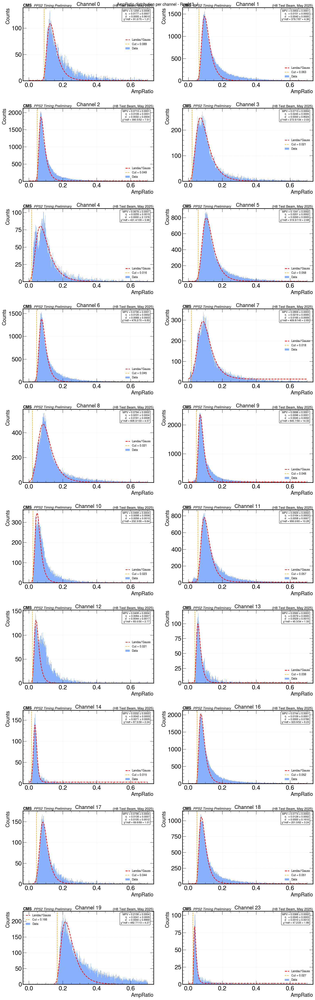


Suggested AmpRatio cut thresholds:
  Channel 0: AmpRatio > 0.0895
  Channel 1: AmpRatio > 0.0633
  Channel 2: AmpRatio > 0.0486
  Channel 3: AmpRatio > 0.0213
  Channel 4: AmpRatio > 0.0157
  Channel 5: AmpRatio > 0.0584
  Channel 6: AmpRatio > 0.0451
  Channel 7: AmpRatio > 0.0182
  Channel 8: AmpRatio > 0.0213
  Channel 9: AmpRatio > 0.0475
  Channel 10: AmpRatio > 0.0234
  Channel 11: AmpRatio > 0.0566
  Channel 12: AmpRatio > 0.0213
  Channel 13: AmpRatio > 0.0384
  Channel 14: AmpRatio > 0.0154
  Channel 16: AmpRatio > 0.0521
  Channel 17: AmpRatio > 0.0440
  Channel 18: AmpRatio > 0.0510
  Channel 19: AmpRatio > 0.1664
  Channel 23: AmpRatio > 0.0269


In [30]:
#AmpRatio hist cuts 
import importlib
import filter_functions
importlib.reload(filter_functions)
from filter_functions import plot_AmpRatio_histograms
print(run_to_process, "\n")
# amplitude_histos = plot_AmpRatio_histograms(
#     parquet_file,
#     n_bins         = 500,
#     x_range        = (0, 1.5),   # set based on your expected signal range
#     channel_filter = [4, 8],
#     logy           = False,
# )

results, thr_AmpRatio = plot_AmpRatio_histograms(
    parquet_file,
    Run = run_to_process,
    channel_filter = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19],
    n_bins         = 500,
    x_range        = (0.00, 0.7),
    fit_window     = None,      # auto: fits rising edge + modest right tail
    mpv_fraction   = 0.10,       # cut at 5% of MPV — adjust based on plots
    logy           = False,
)



Run013_J 



Computing rise times: 11it [01:19,  7.24s/it]


Total hits     : 818,113
Skipped (no RT): 103,882 (12.7%)


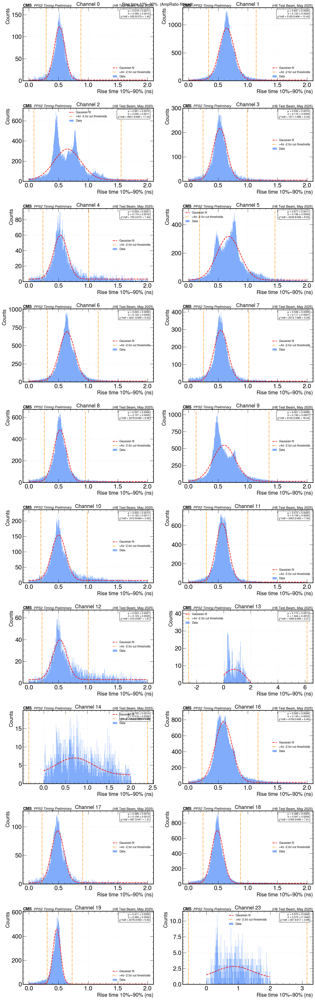


Suggested Rise-Time cut thresholds:
  Channel 0: 0.2931 < RT < 0.8788 ns
  Channel 1: 0.3380 < RT < 1.1411 ns
  Channel 2: 0.0853 < RT < 1.5556 ns
  Channel 3: 0.2447 < RT < 0.9907 ns
  Channel 4: 0.2375 < RT < 1.0090 ns
  Channel 5: 0.1876 < RT < 1.4590 ns
  Channel 6: 0.3131 < RT < 1.1718 ns
  Channel 7: 0.2528 < RT < 1.0164 ns
  Channel 8: 0.2599 < RT < 0.9531 ns
  Channel 9: 0.1269 < RT < 1.3602 ns
  Channel 10: 0.2022 < RT < 0.9837 ns
  Channel 11: 0.3009 < RT < 1.0004 ns
  Channel 12: 0.2234 < RT < 1.0017 ns
  Channel 13: -2.5872 < RT < 6.1481 ns
  Channel 14: -0.3407 < RT < 2.3776 ns
  Channel 16: 0.2299 < RT < 1.1731 ns
  Channel 17: 0.2219 < RT < 0.9091 ns
  Channel 18: 0.2449 < RT < 0.8779 ns
  Channel 19: 0.3090 < RT < 0.7293 ns
  Channel 23: -0.5561 < RT < 3.1508 ns


In [31]:
#rise time hist cuts
import importlib
import filter_functions
importlib.reload(filter_functions)
from filter_functions import plot_rise_time_histograms
print(run_to_process, "\n")
rise_time_histos, thr_rt = plot_rise_time_histograms(
    parquet_file,
    AmpRatio_cuts   = thr_AmpRatio,    # {4: 0.10, 8: 0.05} etc.
    apply_Amp_filter= False,
    channel_filter  = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19],
    n_bins    = 500,
    x_range   = (0.0, 2),   # expected rise time range in ns; set after first look
    low_frac  = 0.1,
    high_frac = 0.9,
    sigma_cut = (2.5,4),
    logy      = False,
)


Run013_J 



Computing SNR: 11it [01:28,  8.02s/it]


Total hits           : 1,000,001
No noise_rms (<=0)   : 0 (0.0%)
Skipped (bad SNR)    : 59,269 (5.9%)


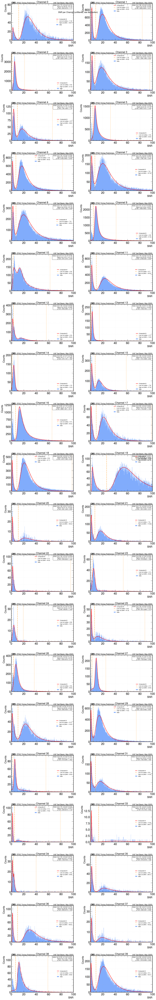


Suggested SNR cut thresholds:
  Channel 0: 11.900 < SNR < 106.746
  Channel 1: 8.700 < SNR < 83.509
  Channel 2: 0.900 < SNR < 21.345
  Channel 3: 7.300 < SNR < 95.832
  Channel 4: 9.700 < SNR < 65.991
  Channel 5: 4.300 < SNR < 32.469
  Channel 6: 7.300 < SNR < 82.520
  Channel 7: 7.300 < SNR < 106.978
  Channel 8: 7.500 < SNR < 105.151
  Channel 9: 4.900 < SNR < 41.626
  Channel 10: 2.900 < SNR < 62.279
  Channel 11: 9.700 < SNR < 105.280
  Channel 12: 3.300 < SNR < 56.256
  Channel 13: 0.700 < SNR < 14.567
  Channel 14: 1.025 < SNR < 10.555
  Channel 15: 7.900 < SNR < 57.839
  Channel 16: 6.700 < SNR < 65.361
  Channel 17: 9.500 < SNR < 98.779
  Channel 18: 8.900 < SNR < 97.707
  Channel 19: 26.300 < SNR < 257.900
  Channel 20: 11.100 < SNR < 165.221
  Channel 21: 7.300 < SNR < 113.649
  Channel 22: 0.100 < SNR < 95.613
  Channel 23: 3.100 < SNR < 52.915
  Channel 24: 9.842 < SNR < 19.144
  Channel 25: 6.900 < SNR < 87.763
  Channel 26: 3.500 < SNR < 36.860
  Channel 27: 2.700 < SN

In [ ]:
#SNR hist cuts
#rise time hist cuts
import importlib
import filter_functions
importlib.reload(filter_functions)
from filter_functions import plot_SNR_histograms
print(run_to_process, "\n")
SNR_hists, thr_snr =plot_SNR_histograms(
    parquet_file,
    channel_filter= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19],
    n_bins      = 500,
    x_range     = (0.0, 80.0),
    sigma_cut   = 2.5,
)

In [32]:
#hit mask
import importlib
import filter_functions
importlib.reload(filter_functions)
from filter_functions import build_hit_mask, apply_hit_mask
print(run_to_process, "\n")
# Build and save the mask once
# good_hits = build_hit_mask(
#     parquet_file,
#     AmpRatio_cuts  = thr_AmpRatio,               # from plot_AmpRatio_histograms
#     rise_time_cuts = thr_rt,          # from plot_rise_time_histograms
#     channel_filter = None,
#     save_path      = f"good_hits_{run_to_process}.npy",
# )
good_hits = build_hit_mask(
    parquet_file,
    AmpRatio_cuts  = thr_AmpRatio,               # from plot_AmpRatio_histograms
    rise_time_cuts = thr_rt,          # from plot_rise_time_histograms
    SNR_cuts       = thr_snr,
    channel_filter = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19],
    save_path      = f"good_hits_{run_to_process}.npy",
)
# Later — reload without reprocessing
#good_hits = np.load(f"good_hits_{run_to_process}.npy")

# Use the mask to load only good waveforms for any downstream step
clean_parquet = apply_hit_mask(parquet_file, good_hits)

# Or pass directly to build_coincidence_histograms by pre-filtering the file
# (or just pass the mask to any function that accepts a HITNumber filter)

Run013_J 



Filtering waveforms: 11it [01:34,  8.62s/it]



Per‑channel filter summary:
  Channel 0: 8760 hits | AmpRatio fails = 190 (2.2%) | RT fails = 1357 (15.5%) | RT None = 488 (5.6%) | SNR fails = 832 (9.5%) | SNR None = 0 (0.0%) | Passed = 6381 (72.8%)
  Channel 1: 92748 hits | AmpRatio fails = 1726 (1.9%) | RT fails = 15231 (16.4%) | RT None = 4160 (4.5%) | SNR fails = 9611 (10.4%) | SNR None = 0 (0.0%) | Passed = 66180 (71.4%)
  Channel 2: 88359 hits | AmpRatio fails = 8957 (10.1%) | RT fails = 27941 (31.6%) | RT None = 23204 (26.3%) | SNR fails = 3675 (4.2%) | SNR None = 0 (0.0%) | Passed = 47786 (54.1%)
  Channel 3: 22285 hits | AmpRatio fails = 1641 (7.4%) | RT fails = 4433 (19.9%) | RT None = 1751 (7.9%) | SNR fails = 2218 (10.0%) | SNR None = 0 (0.0%) | Passed = 13993 (62.8%)
  Channel 4: 9112 hits | AmpRatio fails = 1955 (21.5%) | RT fails = 2419 (26.5%) | RT None = 1052 (11.5%) | SNR fails = 1048 (11.5%) | SNR None = 0 (0.0%) | Passed = 3690 (40.5%)
  Channel 5: 63321 hits | AmpRatio fails = 2729 (4.3%) | RT fails = 17160 (27.

Run013_J 

Loading good_hits from: 'good_hits_Run013_J.npy'
Successfully loaded mask from good_hits_Run013_J.npy
Total hits  : 520,631
Pivot hits  : 16,492
Candidates  : 18,947 (3.6%)
CFD50 lookup failures: 114 / 18,947 (0.60%)
CFD50 lookup: 18,833 hits used, 114 dropped (not in lookup)


Building histograms (pivot ch 19): 100%|██████████| 16490/16490 [00:00<00:00, 55034.16it/s]



Coincidence summary:

  Ch 19 → Ch 0: 6 counts
  Ch 19 → Ch 1: 171 counts
  Ch 19 → Ch 2: 52 counts
  Ch 19 → Ch 3: 16 counts
  Ch 19 → Ch 4: 4 counts
  Ch 19 → Ch 5: 56 counts
  Ch 19 → Ch 6: 121 counts
  Ch 19 → Ch 7: 23 counts
  Ch 19 → Ch 8: 72 counts
  Ch 19 → Ch 9: 1106 counts
  Ch 19 → Ch 10: 16 counts
  Ch 19 → Ch 11: 99 counts
  Ch 19 → Ch 12: 10 counts
  Ch 19 → Ch 13: 20 counts
  Ch 19 → Ch 14: 9 counts
  Ch 19 → Ch 16: 363 counts
  Ch 19 → Ch 17: 10 counts
  Ch 19 → Ch 18: 169 counts
  Ch 19 → Ch 23: 17 counts


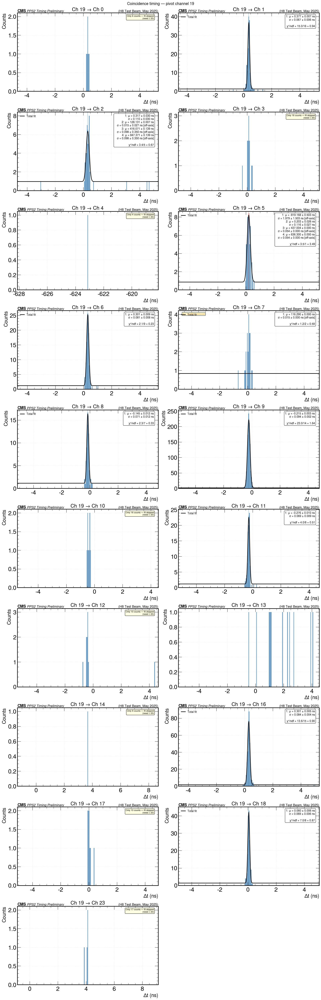

In [74]:
#clean coincidence hist
import pyarrow.parquet as pq
import pyarrow.compute as pc
import numpy as np
import importlib
import filter_functions
importlib.reload(filter_functions)
from filter_functions import load_hit_mask
import coincidence_histograms
importlib.reload(coincidence_histograms)
from coincidence_histograms import build_coincidence_histograms, plot_coincidence_histograms, plot_coincidence_histograms_multipeak

PIVOT_CHANNEL = 19
print(run_to_process, "\n")
print(f"Loading good_hits from: 'good_hits_{run_to_process}.npy'")
good_hits = load_hit_mask(f"good_hits_{run_to_process}.npy")

histograms = build_coincidence_histograms(
    parquet_path  = parquet_file,
    pivot_channel = PIVOT_CHANNEL,
    channel_filter= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19],
    x_range       = 1_000, #1us
    bin_width     = 0.05,
    use_cfd50 = True,
    hit_mask= good_hits,
    cfd50_path = f"{run_to_process}_cfd50.parquet",
)

print("\nCoincidence summary:\n")
for ch, result in histograms.items():
    print(f"  Ch {PIVOT_CHANNEL} → Ch {ch}: {result.total_counts} counts")

plot_coincidence_histograms_multipeak(
    histograms,
    pivot_channel     = PIVOT_CHANNEL,
    time_unit         = "ns",
    prominence_frac   = 0.1,
    min_height_frac   = 0.01,
    min_distance_ns   = 0.5,
    smooth_sigma_bins = 0.0,
    fit_window        = 10.0,          # ~10x expected sigma of 0.3 ns
    sigma_max         = 2.0,          # no Gaussian wider than 2 ns
    merge_distance_ns = 0.6,          # merge peaks/fits closer than 0.5 ns
    plot_range        = 5.0,
    max_peaks         = 4,
    min_counts_for_fit= 20,
)

In [16]:
import importlib
import waveform_analyser
importlib.reload(waveform_analyser)
from waveform_analyser import plot_coincidence_waveforms
print(run_to_process, "\n")
plot_coincidence_waveforms(
    parquet_file,
    pivot_channel  = 8,
    target_channel = 7,
    peaks = [
        {"mu": 0.160, "sigma": 0.312, "label": "Peak 2"},
        {"mu": 10.08, "sigma": 0.349, "label": "Peak 1"},
    ],
    hit_mask       = good_hits,       # from build_hit_mask
    n_total        = 9,              # collect 20 coincidences total
    m_per_plot     = 3,               # 4 columns per figure → 5 figures
    n_sigma        = 2.0,             # search within mu ± 3*sigma
    use_cfd50      = True,
    cfd50_path = f"{run_to_process}_cfd50.parquet",
)
#^^-------------José-------------^^# 

ImportError: cannot import name 'plot_coincidence_waveforms' from 'waveform_analyser' (c:\Users\josev\OneDrive\coisas externas\LIP\PPS2-Timing-TB-Analysis\waveform_analyser.py)

Run013_J 

Loading CFD50 lookup...
CFD50 lookup failures: 10,500 / 622,393
Pivot hits : 46,087
Target hits: 66,180

[Peak 1]  μ=-4.789 ns  σ=0.150 ns
Matches found: 7


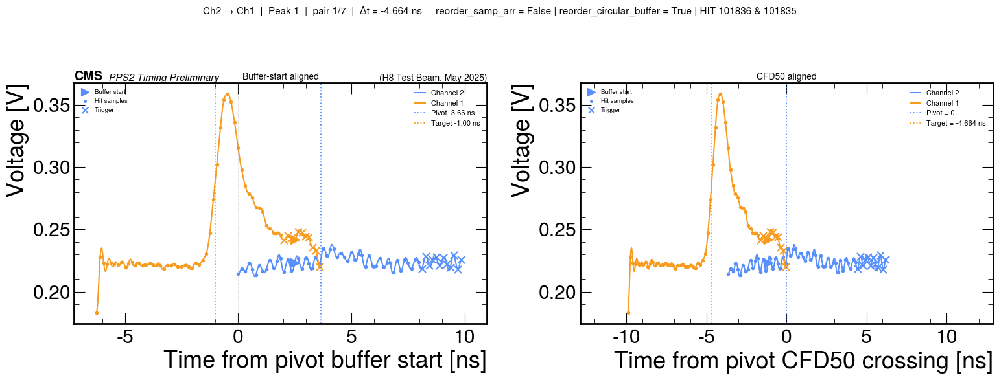

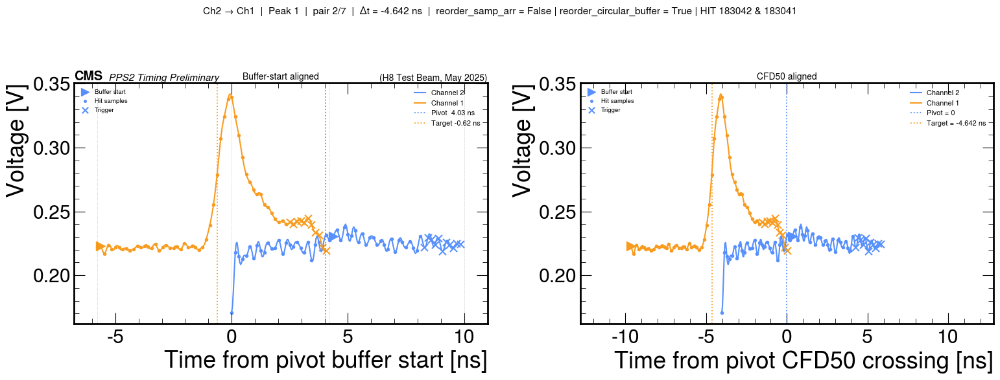

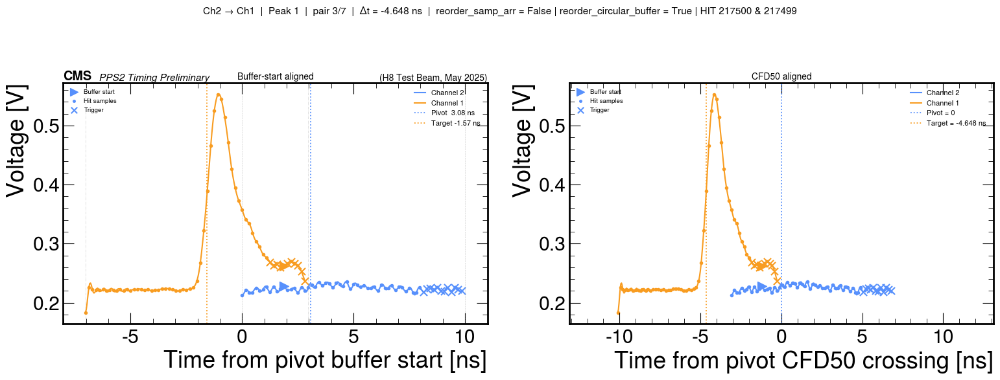

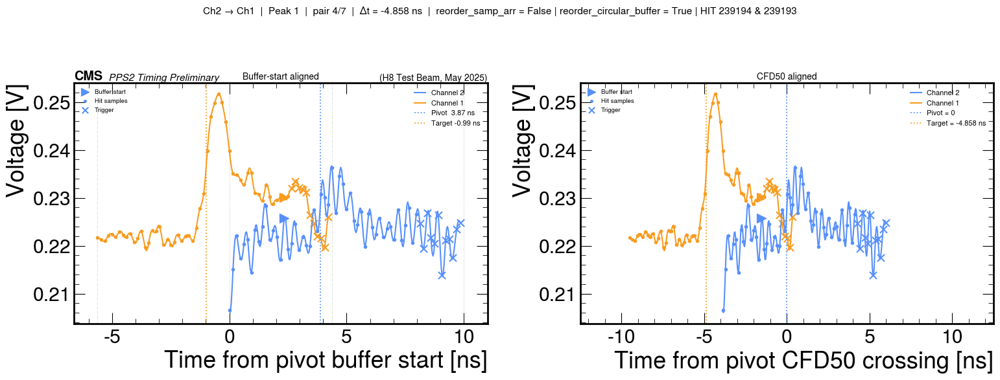

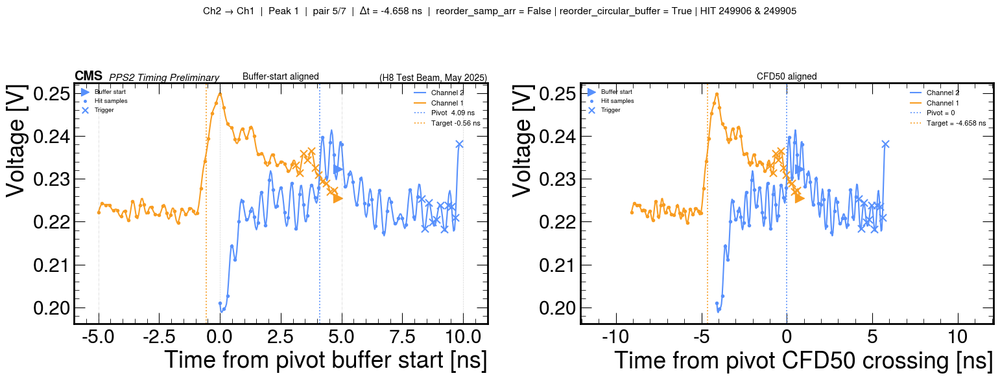

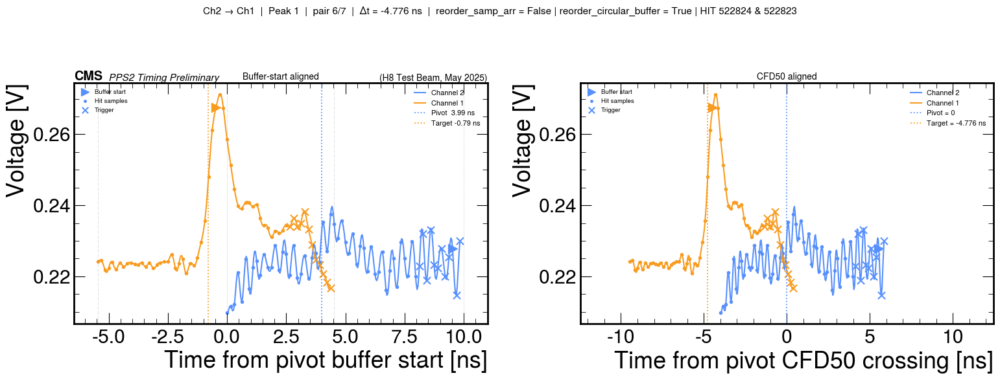

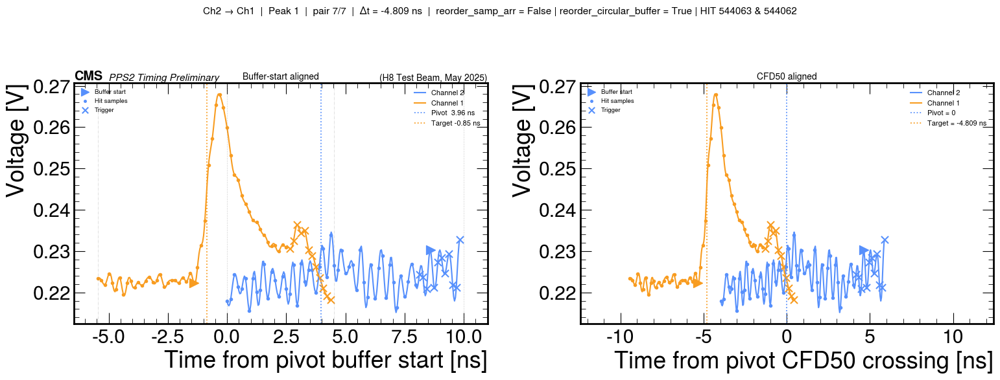


[Peak 3]  μ=4.600 ns  σ=0.150 ns
Matches found: 0

[Peak 2]  μ=0.000 ns  σ=0.150 ns
Matches found: 7


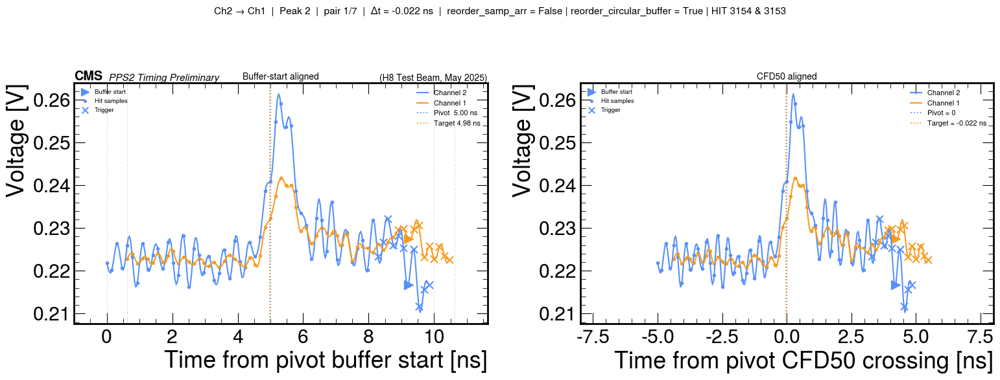

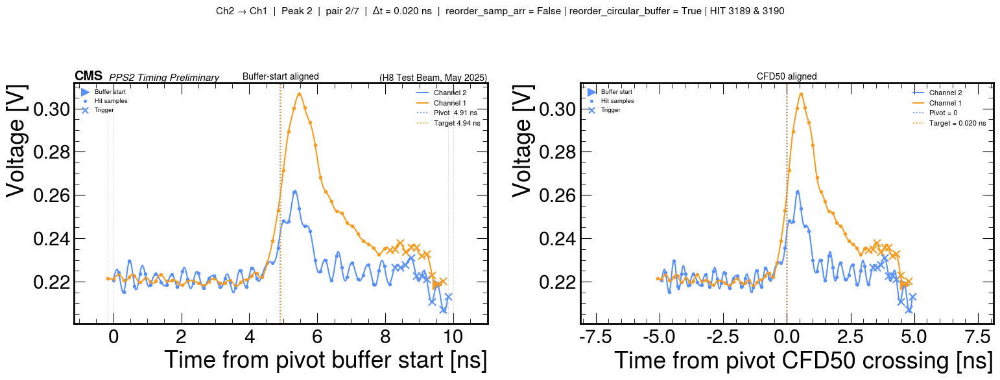

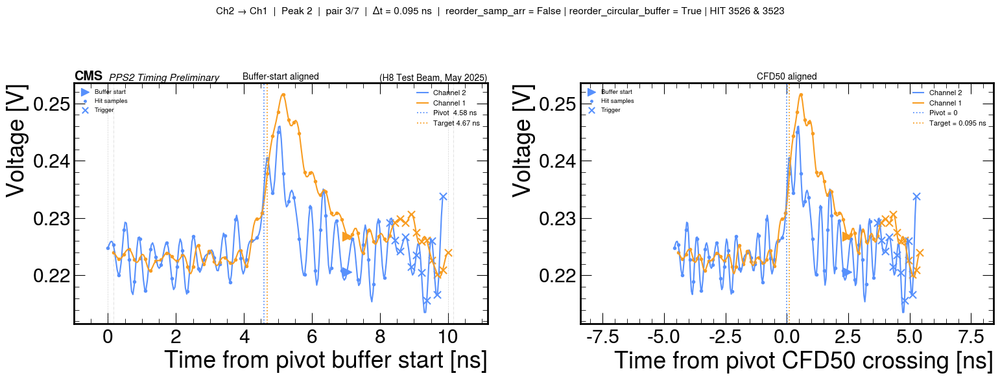

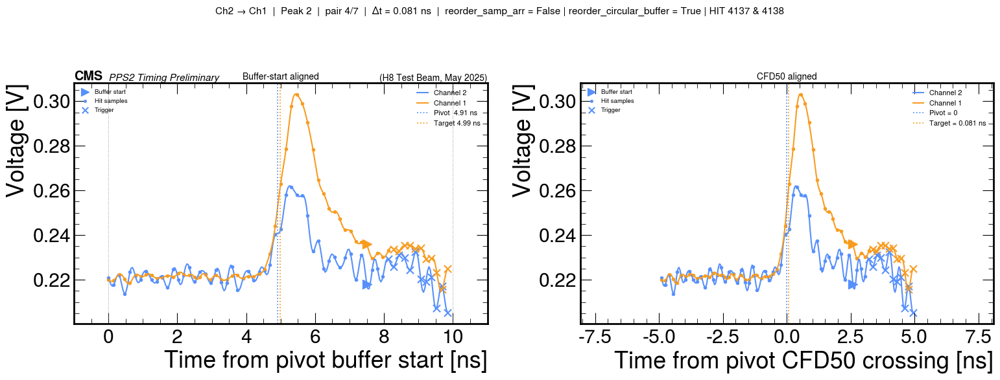

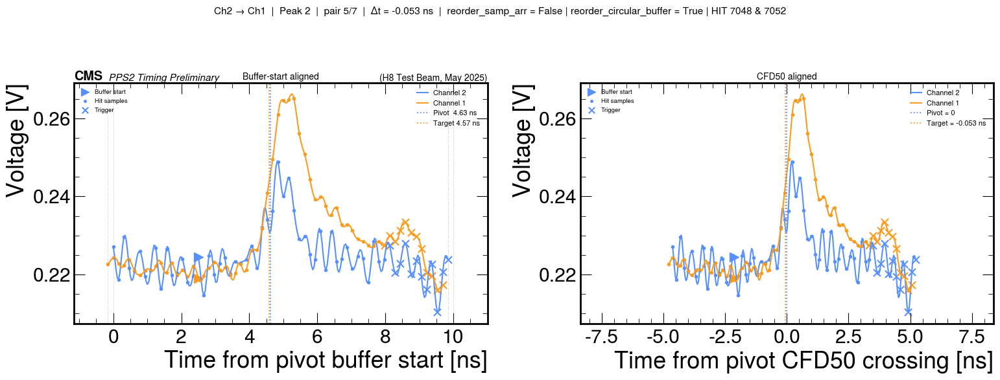

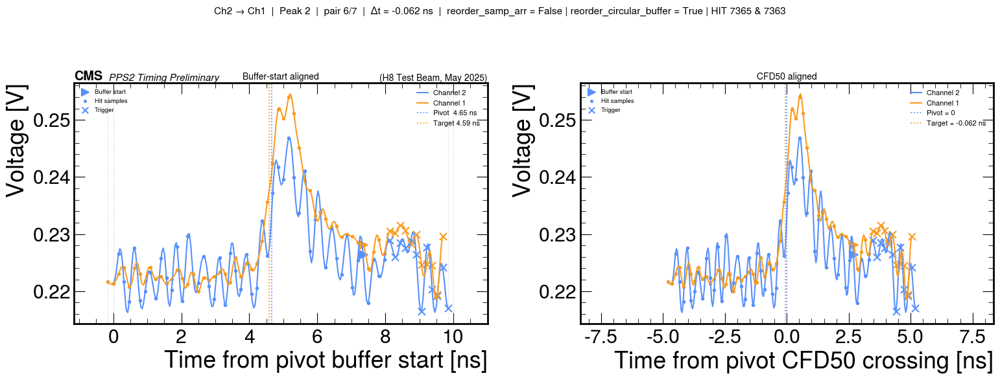

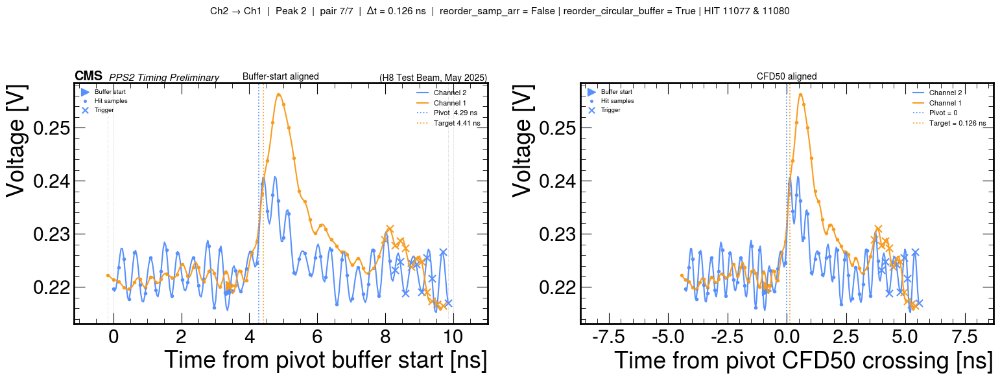

In [25]:
#view waveforms
import importlib
import waveform_analyser
import waveform_analyser as pcd
importlib.reload(waveform_analyser)
importlib.reload(pcd)
from waveform_analyser import plot_coincidence_waveforms_diagnostic
print(run_to_process, "\n")
plot_coincidence_waveforms_diagnostic(
    parquet_path   = parquet_file,
    pivot_channel  = 2,
    target_channel = 1,
    peaks = [
        {"mu": -4.789, "sigma": 0.15, "label": "Peak 1"},
        {"mu": 4.60, "sigma": 0.15, "label": "Peak 3"},
        {"mu": 0.0, "sigma": 0.15, "label": "Peak 2"},
    ],
    hit_mask   = good_hits, #None,
    n_total    = 7,        # fewer — each pair is now 2 panels side by side
    n_sigma    = 1,
    use_cfd50  = True,
    cfd50_path = f"{run_to_process}_cfd50.parquet",
)

In [ ]:
#build full database
from PPS_TB_202505_RunDB import runs_to_configs, run_config_info
from delays_db import Run018
import parameters_database
import filter_functions
import importlib

importlib.reload(parameters_database)
importlib.reload(filter_functions)
from parameters_database import build_full_hit_database

config_key = runs_to_configs[run_to_process]
config_info = run_config_info[config_key]
print(config_info)

print(">>> STEP 1: Building unified hit database...")
# Just run the unified function directly:
final_db_path = build_full_hit_database(
    raw_parquet_path = f"{run_to_process}.parquet",
    config           = config_info,
    hit_mask         = good_hits,
    channel_filter = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 23, 16, 17, 18, 19],

)

ConfigInformation(name='Config 2', sampic_to_board={'PPS_LGAD_03': {0: 10, 1: 9, 2: 8, 3: 7, 4: 6, 5: 5, 6: 4, 7: 3, 8: 2, 9: 1}, 'PPS_TILGAD_AIDA_01': {10: 10, 11: 9, 12: 8, 13: 7, 14: 6, 23: 5, 16: 4, 17: 3, 18: 2, 19: 1}}, bias_voltage={'PPS_LGAD_03': -230.0, 'PPS_TILGAD_AIDA_01': -200.0}, power={'ch1': 4.5, 'ch2': 4.5}, power_connections={'ch1': ('OA02', 'OA05'), 'ch2': ('OA01',)}, sampic_amplifiers={0: 'OA02.8', 1: 'OA02.7', 2: 'OA02.6', 3: 'OA02.5', 4: 'OA02.4', 5: 'OA02.3', 6: 'OA02.2', 7: 'OA02.1', 8: 'OA05.8', 9: 'OA05.7', 10: 'OA05.6', 11: 'OA05.5', 12: 'OA05.4', 13: 'OA05.3', 14: 'OA05.2', 16: 'OA01.8', 17: 'OA01.7', 18: 'OA01.6', 19: 'OA01.5', 23: 'OA05.1'}, board_order=['PPS_TILGAD_AIDA_01', 'PPS_LGAD_03'], sensor_channels={1: [(4, 0)], 2: [(4, 1), (4, 2), (3, 1), (3, 2)], 3: [(2, 0), (2, 1)], 4: [(1, 1)], 5: [(0, 0)], 6: [(0, 3), (1, 3), (2, 3)], 7: [(0, 4), (1, 4), (2, 4), (3, 4)], 8: [(2, 2)], 9: [(3, 3)], 10: [(4, 4)]})
>>> STEP 1: Building unified hit database...
Usin

Building Full Database: 0it [00:00, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/100000 [00:00<?, ?it/s]

Hits:   0%|          | 0/1 [00:00<?, ?it/s]


Full Corrected Database Built Successfully
Raw Input         : Run013_J.parquet
Output Database   : Run013_J_full_hit_db.parquet

Total Hits Seen   : 1,000,001
Total Hits Kept   : 520,631
Rejected by Mask  : 377,608
Unknown Channels  : 101,762
RiseTime Failures : 0



In [27]:
#Read a bit from the database
import pyarrow.parquet as pq

pf = pq.ParquetFile("run018_full_hit_db.parquet")
cols = pf.schema.names[:20]

table = pq.read_table("run018_full_hit_db.parquet", columns=cols)
print(table.slice(0, 5).to_pandas())   # first 5 rows



   HITNumber  Channel                LGAD  PixelRow  PixelCol  Baseline  \
0          1        2         PPS_LGAD_03         2         2  0.238719   
1          2        9  PPS_TILGAD_AIDA_01         4         4  0.241655   
2          3        2         PPS_LGAD_03         2         2  0.238118   
3          4        4  PPS_TILGAD_AIDA_01         4         1  0.242612   
4          5        8  PPS_TILGAD_AIDA_01         3         3  0.240939   

    RawPeak  AmpRatio  RiseTime        SNR  CFD10Offset  CFD10Slope  \
0  0.284681  0.192538  0.572570  15.381433     3.948923    0.017414   
1  0.270223  0.118218  0.524124  23.872038     3.833040    0.045948   
2  0.277960  0.167320  0.718567  14.094340     3.841825    0.011915   
3  0.290407  0.197003  0.778747  25.896687     3.506193    0.024349   
4  0.289794  0.202768  0.535614  83.451874     4.226371    0.044440   

   CFD15Offset  CFD15Slope  CFD20Offset  CFD20Slope  CFD25Offset  CFD25Slope  \
0     4.067242    0.065548     4.102158   

Hits after basic filter : 817,402  (removed 0)


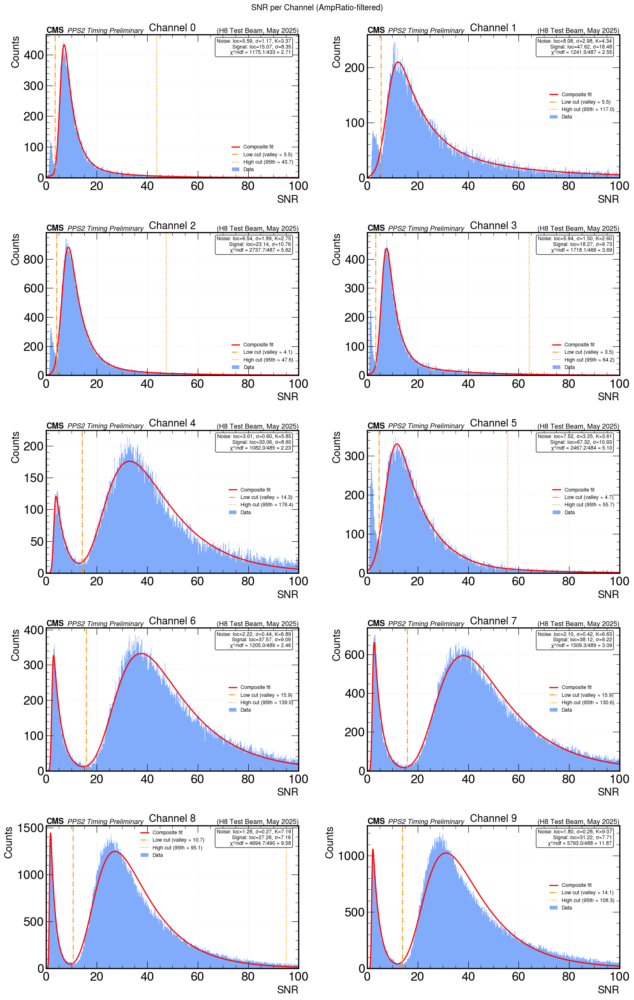


Suggested SNR cut thresholds:
  Channel 0: 3.500 < SNR < 43.725
  Channel 1: 5.500 < SNR < 116.995
  Channel 2: 4.100 < SNR < 47.553
  Channel 3: 3.500 < SNR < 64.154
  Channel 4: 14.300 < SNR < 176.403
  Channel 5: 4.700 < SNR < 55.675
  Channel 6: 15.900 < SNR < 139.038
  Channel 7: 15.900 < SNR < 130.629
  Channel 8: 10.700 < SNR < 95.070
  Channel 9: 14.100 < SNR < 108.284


In [24]:
#SNR histograms and cuts
import importlib
import filter_functions
importlib.reload(filter_functions)
from filter_functions import plot_SNR_histograms
PARQUET = "run018_full_hit_db.parquet"

snr_results, snr_thresholds = plot_SNR_histograms(
    PARQUET,
    AmpRatio_cuts= False,
    x_range=(0, 100),        # fix x-axis across all channels for easy comparison
    sigma_cut=2.5,          # default, same as your rise-time plots
    n_bins=500,
    logy=False,
)


>>> STEP 2: Grouping hits into coincidence events...
Loading corrected DB: Run018_full_hit_db.parquet
  817,402 hits loaded

  Channel       Total   Bad time    Passing
  ------------------------------------------
  0            18,147        121     18,026
  1            27,570          6     27,564
  2            50,322        631     49,691
  3            21,863      1,563     20,300
  4            40,074         18     40,056
  5            35,164      1,830     33,334
  6            75,762        116     75,646
  7           135,842        163    135,679
  8           216,314     21,391    194,923
  9           196,344        643    195,701
  ------------------------------------------
  TOTAL       817,402     26,482    790,920
  777,714 coincidence groups formed

Event database built
  Total groups formed   :    777,714
  Discarded (<2 LGADs)  :    773,667
  Discarded (case 3)    :        185
  Valid events kept     :      3,862
  Of which cluster hits :        128
  Output     

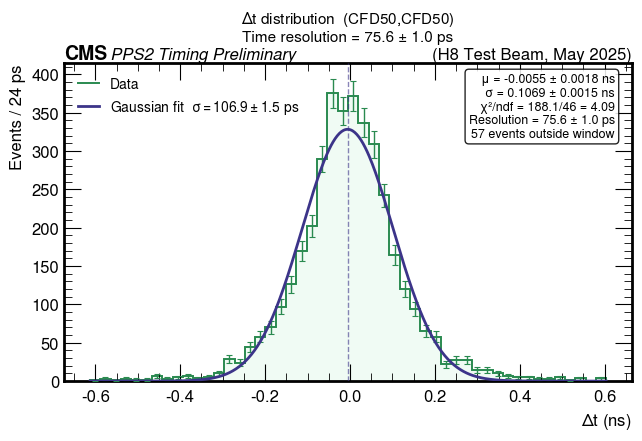

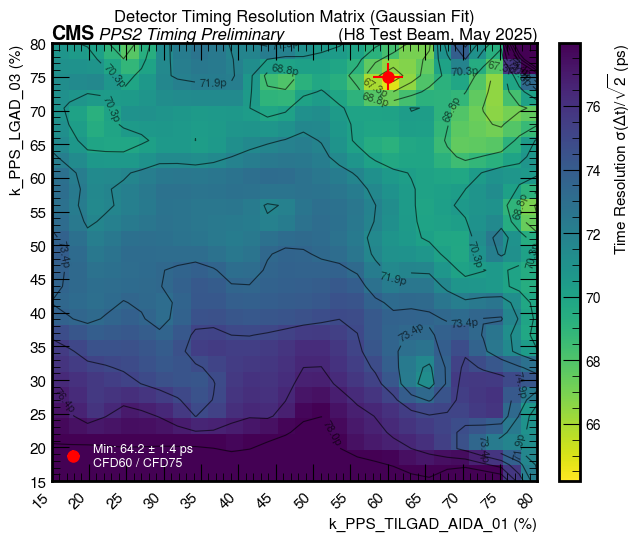

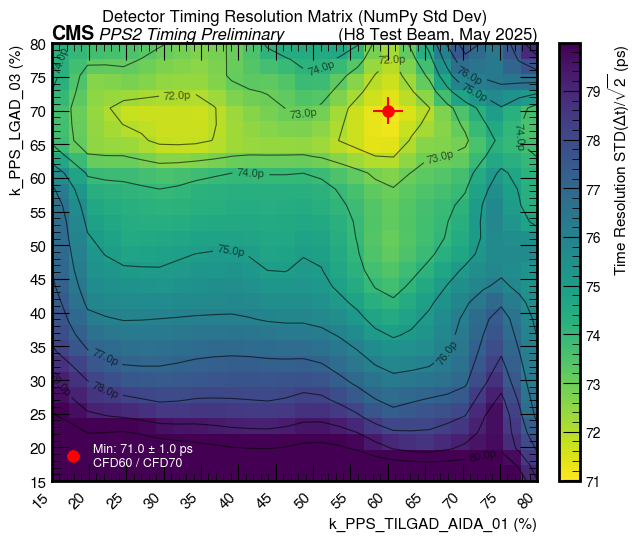

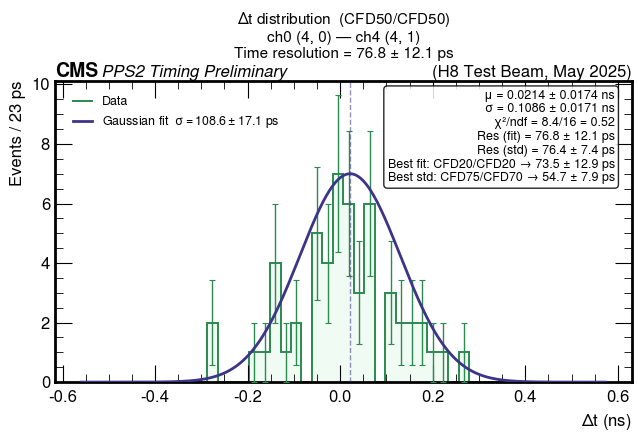

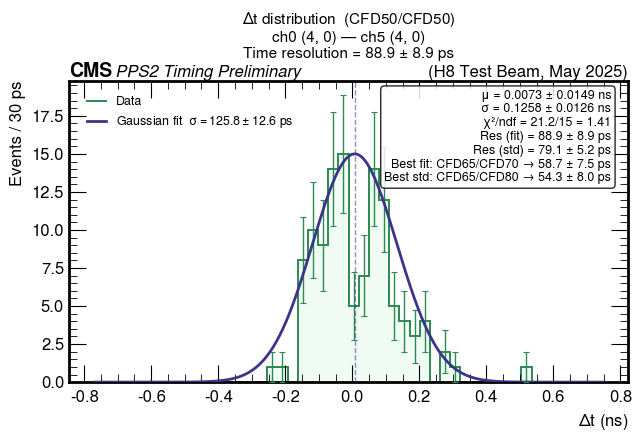

...

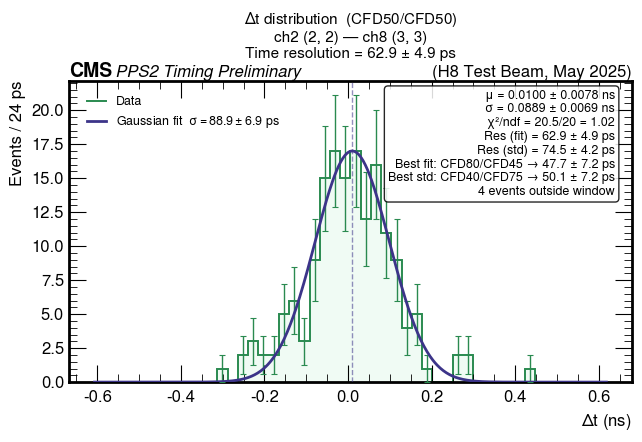

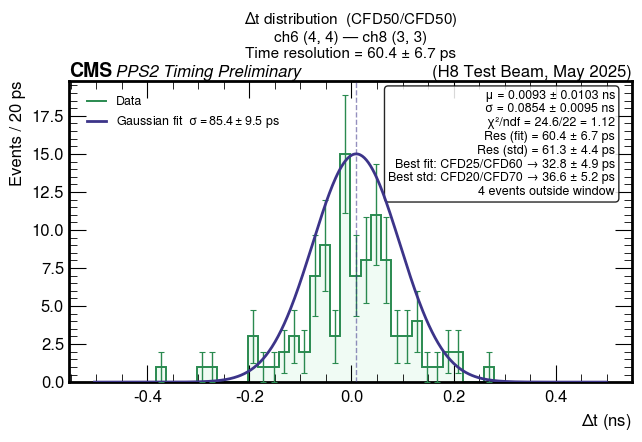

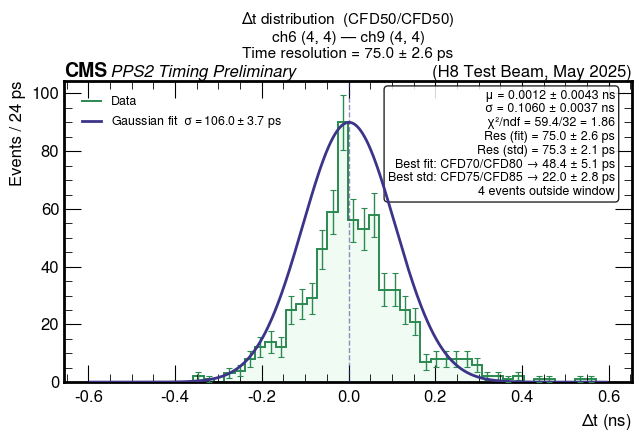

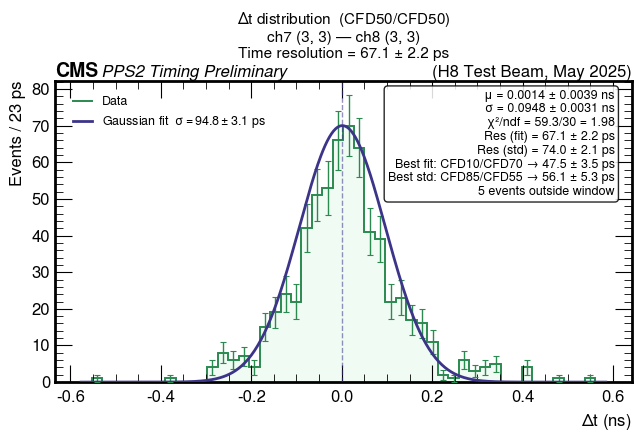

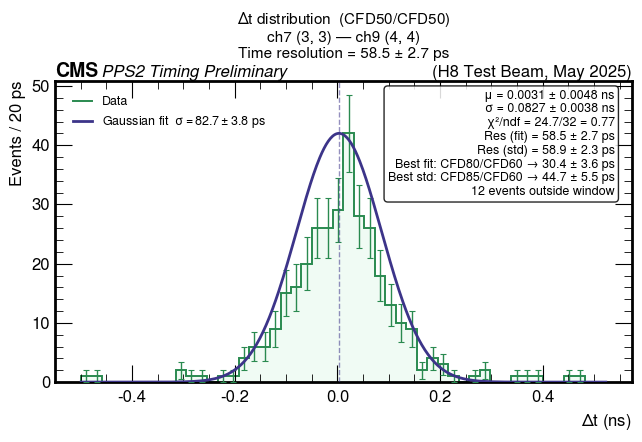


>>> Pipeline complete.


In [84]:
#resolution results
# resolution results
import delta_t_analysis
import matplotlib.pyplot as plt

importlib.reload(delta_t_analysis)
from delta_t_analysis import build_events, plot_delta_t_histogram, plot_resolution_heatmap, plot_channel_pair_histograms


print("\n>>> STEP 2: Grouping hits into coincidence events...")
events_file = build_events(
    corrdb_path           = f"{run_to_process}_full_hit_db.parquet",
    run_name              = run_to_process,
    coincidence_window_ns = 100.0,
    event_building_cfd    = 50,
)

# -------------------------------------------------------------------------
# 4. Generate Visual Diagnostics
# -------------------------------------------------------------------------
print("\n>>> STEP 3: Generating diagnostic plots...")

# Plot A: 1D Histogram for the 50% - 50% CFD pair, EXCLUDING clusters
fig_hist = plot_delta_t_histogram(
    events_path    = events_file,
    k1             = 50, #yaxis on heatmap
    k2             = 50, #xaxis on heatmap
    cluster_filter = "Exclude",
    n_bins= 50
)
fig_hist.savefig("dt_histogram_CFD50.png", dpi=300)
print("Saved -> dt_histogram_CFD50.png")

# Plot B: 2D Heatmaps of time resolution across ALL CFD pairs
fig_fit, fig_std, res_min_fit, err_min_fit, res_min_std, err_min_std = plot_resolution_heatmap(
    events_path  = events_file,
    lgad1_label  = "PPS_LGAD_03",
    lgad2_label  = "PPS_TILGAD_AIDA_01",
    n_contours   = 10,
    n_bins       = 200,
    cfd_levels   = [15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80],
)
fig_fit.savefig("heatmap_gaussian_fit.png", dpi=300)
fig_std.savefig("heatmap_numpy_std.png",    dpi=300)
print("Saved -> heatmap_gaussian_fit.png, heatmap_numpy_std.png")

print(f"Resulution from fit = {res_min_fit} ± {err_min_fit}ps")
print(f"Resulution from unbined std = {res_min_std} ± {err_min_std}ps")

# Plot C: Per adjacent channel-pair Δt histograms + summary table
print("\n>>> STEP 4: Per-channel-pair analysis...")
pair_figures = plot_channel_pair_histograms(
    events_path = events_file,
    corrdb_path = f"{run_to_process}_full_hit_db.parquet",
    cfd_levels  = [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85],
    cfd_plot    = 50,
    n_bins      = 50,
    pooled_res_fit_ps     = res_min_fit,
    pooled_res_fit_err_ps = err_min_fit,
    pooled_res_std_ps     = res_min_std,
    pooled_res_std_err_ps = res_min_std,
    output_dir            = "channel_pair_plots",   # saves dt_pair_chA_chB.png for each pair
)

plt.show()
print("\n>>> Pipeline complete.")

In [73]:
table = pq.read_table("Run018_full_hit_db_events.parquet", columns=["Dt_50_50"])
dt = np.array(table["Dt_50_50"].to_pylist(), dtype=np.float64)
dt = dt[np.isfinite(dt)]
print(f"Mean Δt: {dt.mean():.3f} ns")
print(f"Std  Δt: {dt.std():.3f} ns")
print(f"kMAD Δt: {1.4826 * np.median(np.abs(dt - np.median(dt))):.3f} ns")

Mean Δt: -0.076 ns
Std  Δt: 4.627 ns
kMAD Δt: 0.102 ns


In [ ]:
#SNR overall cuts
import numpy as np
import pyarrow.parquet as pq
import plotly.graph_objects as go
from scipy.optimize import curve_fit
from scipy.stats import moyal
from scipy.ndimage import gaussian_filter1d

# 1. Load data
table = pq.read_table("run018_full_hit_db.parquet", columns=["SNR"])
snr_vals = table["SNR"].to_numpy()
snr_vals = snr_vals[np.isfinite(snr_vals) & (snr_vals >= 0) & (snr_vals <= 500)]

# 2. Compute binned data
n_bins = 2000
counts, edges = np.histogram(snr_vals, bins=n_bins)
centers = 0.5 * (edges[:-1] + edges[1:])

# 3. Find valley — smooth and find minimum between noise blob and signal peak
smoothed    = gaussian_filter1d(counts.astype(float), sigma=5)
valley_mask = (centers > 12) & (centers < 25)
valley_snr  = centers[valley_mask][np.argmin(smoothed[valley_mask])]

# 4. Model
def combined_snr_model(x, amp_n, mu_n, sigma_n, amp_s, loc_s, scale_s):
    noise  = amp_n * np.exp(-0.5 * ((x - mu_n) / sigma_n) ** 2)
    signal = amp_s * moyal.pdf(x, loc=loc_s, scale=scale_s)
    return noise + signal

p0 = [
    max(counts[:30]), 10.0, 2.5,
    max(counts[30:]), 30.0, 5.0,
]
bounds = (
    [0,      5,  0.5, 0,      20, 1],
    [np.inf, 15, 6.0, np.inf, 40, 15]
)

# 5. Fit & Chi-Square
try:
    popt, pcov = curve_fit(combined_snr_model, centers, counts, p0=p0, bounds=bounds, maxfev=10000)

    fit_total = combined_snr_model(centers, *popt)
    nonzero   = fit_total > 0
    chi2      = np.sum(((counts[nonzero] - fit_total[nonzero]) ** 2) / fit_total[nonzero])
    ndf       = len(counts[nonzero]) - len(popt)
    reduced_chi2 = chi2 / ndf

    amp_n, mu_n, sigma_n, amp_s, loc_s, scale_s = popt

    print("=" * 50)
    print("FIT RESULTS")
    print("=" * 50)
    print(f"Noise  μ={mu_n:.2f},  σ={sigma_n:.2f}")
    print(f"Signal loc={loc_s:.2f}, scale={scale_s:.2f}")
    print(f"χ²/ndf  {chi2:.1f} / {ndf} = {reduced_chi2:.2f}")
    print("-" * 50)
    print(f"Valley cut: SNR = {valley_snr:.1f}")

    # 6. Plotting
    x_fine         = np.linspace(0, 150, 1000)
    fit_total_fine = combined_snr_model(x_fine, *popt)
    fit_noise      = popt[0] * np.exp(-0.5 * ((x_fine - popt[1]) / popt[2]) ** 2)
    fit_signal     = popt[3] * moyal.pdf(x_fine, loc=popt[4], scale=popt[5])

    fig = go.Figure()
    fig.add_trace(go.Histogram(
        x=snr_vals, nbinsx=n_bins, name="Raw Data",
        marker_color="#134D9E", opacity=0.9))
    fig.add_trace(go.Scatter(
        x=x_fine, y=fit_total_fine,
        name=f"Fit (χ²/ndf={reduced_chi2:.2f})",
        line=dict(color="black", width=3)))
    fig.add_trace(go.Scatter(
        x=x_fine, y=fit_noise, name="Noise (Gaussian)",
        line=dict(color="crimson", width=2, dash="dash")))
    fig.add_trace(go.Scatter(
        x=x_fine, y=fit_signal, name="Signal (Moyal)",
        line=dict(color="forestgreen", width=2, dash="dot")))

    fig.add_vline(
        x=5, line_width=2.5, line_dash="dash", line_color="orange",
        annotation_text="Cut (SNR=5)", annotation_position="top left")
    fig.add_vline(
        x=valley_snr, line_width=2.5, line_dash="dash", line_color="purple",
        annotation_text=f"Valley ({valley_snr:.1f})", annotation_position="top right")

    fig.update_layout(
        title="SNR Histogram", xaxis_title="SNR", yaxis_title="Counts",
        barmode="overlay", template="plotly_white")
    fig.show()

except RuntimeError as e:
    print(f"Fit failed: {e}")

FIT RESULTS
Noise  μ=5.23,  σ=5.62
Signal loc=29.68, scale=8.73
χ²/ndf  84056380176.6 / 1994 = 42154654.05
--------------------------------------------------
Valley cut: SNR = 15.0


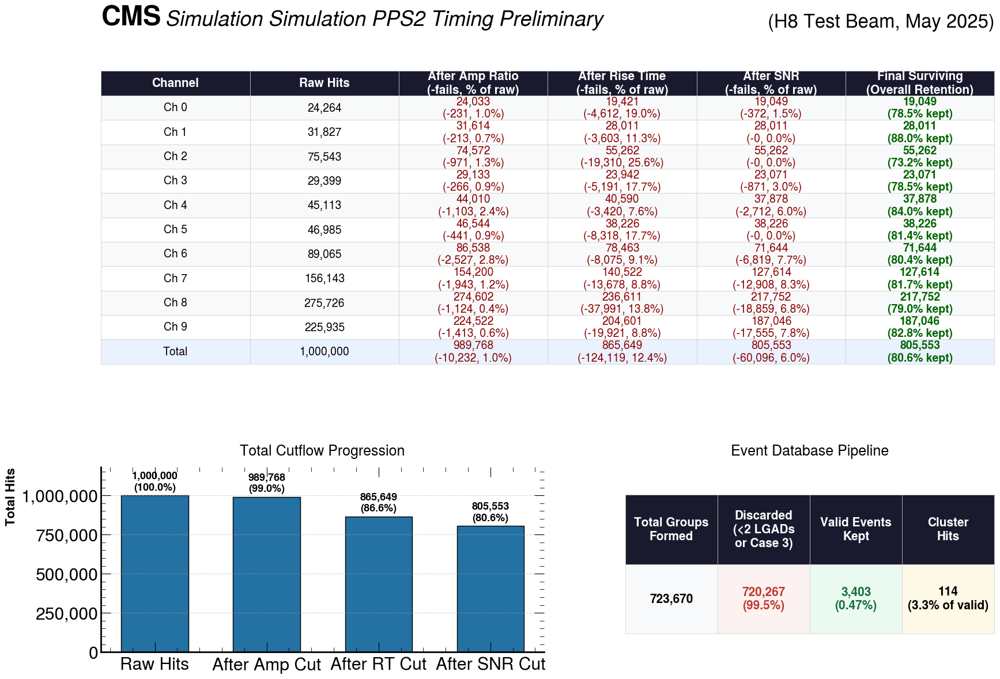

In [22]:
#cutflow charts
import numpy as np
import matplotlib.pyplot as plt
import mplhep as hep

# Use CMS style
hep.style.use("CMS")

# ── Data ──────────────────────────────────────────────────────────────────────
channels = np.arange(10)

raw      = np.array([24264, 31827, 75543, 29399, 45113, 46985, 89065, 156143, 275726, 225935])
amp_fail = np.array([  231,   213,   971,   266,  1103,   441,  2527,   1943,   1124,   1413])
rt_fail  = np.array([ 4612,  3603, 19310,  5191,  3420,  8318,  8075,  13678,  37991,  19921])
snr_fail = np.array([  372,     0,     0,   871,  2712,     0,  6819,  12908,  18859,  17555])

# Calculate surviving hits at each stage
after_amp = raw - amp_fail
after_rt  = after_amp - rt_fail
after_snr = after_rt - snr_fail

# Totals
tot_raw       = raw.sum()
tot_after_amp = after_amp.sum()
tot_after_rt  = after_rt.sum()
tot_survive   = after_snr.sum()

# Event-level numbers
n_groups    = 723_670
n_discarded = 720_104 + 163
n_valid     = 3_403
n_cluster   = 114

# ── Layout Setup ──────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(20, 14))
# Increased hspace to 0.4 to prevent titles from overlapping the top table
gs = fig.add_gridspec(2, 2, height_ratios=[1.8, 1], width_ratios=[1.2, 1], hspace=0.4, wspace=0.2)

ax_table  = fig.add_subplot(gs[0, :])
ax_bar    = fig.add_subplot(gs[1, 0])
ax_events = fig.add_subplot(gs[1, 1])

for ax in [ax_table, ax_events]:
    ax.axis("off")

# ── 1. Cutflow Table ──────────────────────────────────────────────────────────
col_labels = [
    "Channel", 
    "Raw Hits", 
    "After Amp Ratio\n(-fails, % of raw)", 
    "After Rise Time\n(-fails, % of raw)", 
    "After SNR\n(-fails, % of raw)", 
    "Final Surviving\n(Overall Retention)"
]

cell_text = []
cell_colors = []

def fmt(n): return f"{n:,.0f}"
def cut_str(surv, fail, ref): return f"{fmt(surv)}\n(-{fmt(fail)}, {100*fail/ref:.1f}%)"
def surv_str(surv, ref): return f"{fmt(surv)}\n({100*surv/ref:.1f}% kept)"

for i, ch in enumerate(channels):
    row_col = "#f8f9fa" if i % 2 == 0 else "#ffffff"
    row = [
        f"Ch {ch}",
        fmt(raw[i]),
        cut_str(after_amp[i], amp_fail[i], raw[i]),
        cut_str(after_rt[i], rt_fail[i], raw[i]),
        cut_str(after_snr[i], snr_fail[i], raw[i]),
        surv_str(after_snr[i], raw[i]),
    ]
    cell_text.append(row)
    cell_colors.append([row_col] * len(col_labels))

# Add Total Row
cell_text.append([
    "Total",
    fmt(tot_raw),
    cut_str(tot_after_amp, amp_fail.sum(), tot_raw),
    cut_str(tot_after_rt, rt_fail.sum(), tot_raw),
    cut_str(tot_survive, snr_fail.sum(), tot_raw),
    surv_str(tot_survive, tot_raw)
])
cell_colors.append(["#eaf2ff"] * len(col_labels))

# bbox=[x, y, width, height] -> Leaves top 12% empty for the CMS Label
tbl = ax_table.table(
    cellText=cell_text,
    colLabels=col_labels,
    cellColours=cell_colors,
    loc="center",
    cellLoc="center",
    bbox=[0, 0, 1, 0.88] 
)

tbl.auto_set_font_size(False)
tbl.set_fontsize(14)  # Much larger text

for (r, c), cell in tbl.get_celld().items():
    cell.set_linewidth(0.5)
    cell.set_edgecolor("#cccccc")
    if r == 0:
        cell.set_facecolor("#1a1a2e")
        cell.set_text_props(color="white", fontweight="bold", fontsize=15)
    else:
        if c in [2, 3, 4] and r > 0:
            cell.get_text().set_color("#8b0000") 
        if c == 5 and r > 0:
            cell.get_text().set_color("#006400")
            cell.get_text().set_fontweight("bold")

# CMS Label will now safely sit in the 12% whitespace above the table
hep.cms.label("Simulation PPS2 Timing Preliminary", data=False, rlabel="(H8 Test Beam, May 2025)", loc=0, ax=ax_table)

# ── 2. Total Cutflow Histogram (Bar Chart) ────────────────────────────────────
stages = ["Raw Hits", "After Amp Cut", "After RT Cut", "After SNR Cut"]
values = [tot_raw, tot_after_amp, tot_after_rt, tot_survive]

bars = ax_bar.bar(stages, values, color="#2471a3", edgecolor="black", width=0.6)

for bar, val in zip(bars, values):
    ax_bar.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + (tot_raw * 0.02),
        f"{val:,.0f}\n({100*val/tot_raw:.1f}%)",
        ha="center", va="bottom", fontsize=13, fontweight="bold"
    )

ax_bar.set_ylim(0, tot_raw * 1.18)
ax_bar.set_ylabel("Total Hits", fontsize=16, fontweight="bold")
ax_bar.set_title("Total Cutflow Progression", fontsize=18, pad=15)
ax_bar.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{int(x):,}"))
ax_bar.grid(axis="y", linestyle="--", alpha=0.5)
ax_bar.spines[["top", "right"]].set_visible(False)

# ── 3. Event Database Summary ─────────────────────────────────────────────────
# Added an extra newline to column 2 to prevent squishing
ev_labels = ["Total Groups\nFormed", "Discarded\n(<2 LGADs\nor Case 3)", "Valid Events\nKept", "Cluster\nHits"]
ev_vals = [
    f"{n_groups:,}",
    f"{n_discarded:,}\n({100*n_discarded/n_groups:.1f}%)",
    f"{n_valid:,}\n({100*n_valid/n_groups:.2f}%)",
    f"{n_cluster:,}\n({100*n_cluster/n_valid:.1f}% of valid)"
]

# Using bbox to properly size the table and leave room for the title above it
ev_tbl = ax_events.table(
    cellText=[ev_vals],
    colLabels=ev_labels,
    cellColours=[["#f8f9fa", "#fdf2f2", "#eafaf1", "#fef9e7"]],
    loc="center",
    cellLoc="center",
    bbox=[0, 0.1, 1, 0.75]
)

ev_tbl.auto_set_font_size(False)
ev_tbl.set_fontsize(15)

for (r, c), cell in ev_tbl.get_celld().items():
    cell.set_linewidth(0.5)
    cell.set_edgecolor("#cccccc")
    if r == 0:
        cell.set_facecolor("#1a1a2e")
        cell.set_text_props(color="white", fontweight="bold", fontsize=15)
    else:
        cell.get_text().set_fontweight("bold")
        if c == 1: cell.get_text().set_color("#c0392b") 
        if c == 2: cell.get_text().set_color("#196f3d") 

ax_events.set_title("Event Database Pipeline", fontsize=18, pad=15)

# ── Save & Show ───────────────────────────────────────────────────────────────
# Remove tight_layout here so it doesn't override our manual GridSpec spacing
plt.savefig("cutflow_dashboard_v2.pdf", bbox_inches="tight", dpi=150)
plt.savefig("cutflow_dashboard_v2.png", bbox_inches="tight", dpi=150)
plt.show()

In [ ]:
#parameter scatter matrix
import plotly.express as px
import pyarrow.parquet as pq
import pandas as pd
import numpy as np

cols = ["Channel", "SNR", "AmpRatio", "RiseTime", "CFD50Offset"]
df = pq.read_table("Run018_full_hit_db.parquet", columns=cols).to_pandas()

mask = (
    np.isfinite(df["Channel"]) &
    np.isfinite(df["SNR"]) & df["SNR"].between(0, 500) &
    np.isfinite(df["AmpRatio"]) & df["AmpRatio"].between(0, 5) &
    np.isfinite(df["RiseTime"]) & df["RiseTime"].between(0, 10) &
    np.isfinite(df["CFD50Offset"]) & df["CFD50Offset"].between(0, 30)
)

df = df.loc[mask].copy()

df = (
    df.groupby("Channel")
      .apply(lambda g: g.sample(n=min(len(g), 1000), random_state=42))
      .reset_index(level=0, drop=False)
      .reset_index(drop=True)
)

fig = px.scatter_matrix(
    df,
    dimensions=["SNR", "AmpRatio", "RiseTime", "CFD50Offset"],
    symbol ="Channel",
    #color  = "Channel",
    opacity=0.4,
    title="Per-channel parameter matrix",
)

fig.update_traces(marker=dict(size=3), diagonal_visible=True)
fig.update_layout(height=900, width=900, template="plotly_white")

fig.show()